# Raw data plot

In [1]:
options(repr.plot.width =40, repr.plot.height = 30)

## Define Function

In [2]:
setwd("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/")

## Load Library
library("susiF.alpha")
library("plink2R")
library("dplyr")
library("readr")
library("stringr")
library("purrr")
library("tidyr")
library("ggplot2")
## Define function
compute_maf <- function(geno){
  f <- mean(geno,na.rm = TRUE)/2
  return(min(f, 1-f))
}

compute_missing <- function(geno){
  miss <- sum(is.na(geno))/length(geno)
  return(miss)
}

mean_impute <- function(geno){
  f <- apply(geno, 2, function(x) mean(x,na.rm = TRUE))
  for (i in 1:length(f)) geno[,i][which(is.na(geno[,i]))] <- f[i]
  return(geno)
}

is_zero_variance <- function(x) {
  if (length(unique(x))==1) return(T)
  else return(F)
}

filter_X <- function(X, missing_rate_thresh, maf_thresh) {
    rm_col <- which(apply(X, 2, compute_missing) > missing_rate_thresh)
    if (length(rm_col)) X <- X[, -rm_col]
    rm_col <- which(apply(X, 2, compute_maf) < maf_thresh)
    if (length(rm_col)) X <- X[, -rm_col]
    rm_col <- which(apply(X, 2, is_zero_variance))
    if (length(rm_col)) X <- X[, -rm_col]
    return(mean_impute(X))
}

compute_cov_flash <- function(Y, error_cache = NULL){
    covar <- diag(ncol(Y))
    tryCatch({
    fl <- flashier::flash(Y, var.type = 2, prior.family = c(flashier::prior.normal(), flashier::prior.normal.scale.mix()), backfit = TRUE, verbose.lvl=0)
    if(fl$n.factors==0){
      covar <- diag(fl$residuals.sd^2)
    } else {
      fsd <- sapply(fl$fitted.g[[1]], '[[', "sd")
      covar <- diag(fl$residuals.sd^2) + crossprod(t(fl$flash.fit$EF[[2]]) * fsd)
    }
    if (nrow(covar) == 0) {
      covar <- diag(ncol(Y))
      stop("Computed covariance matrix has zero rows")
    }
    }, error = function(e) {
      if (!is.null(error_cache)) {
        saveRDS(list(data=Y, message=warning(e)), error_cache)
        warning("FLASH failed. Using Identity matrix instead.")
        warning(e)
      } else {
        stop(e)
      }
    })
    s <- apply(Y, 2, sd, na.rm=T)
    if (length(s)>1) s = diag(s)
    else s = matrix(s,1,1)
    covar <- s%*%cov2cor(covar)%*%s
    return(covar)
}

read_multi_pheno = function(path){
  arg = paste0(c("tabix -h ",path," chr8:141440000-143280000"),collapse = "")
  result = system(arg,intern = T)
    if (is.na(result[2]) == F){
      output = read.table(text = result[2:length(result)], sep = "\t")
      colnames(output) = result[1]%>%stringr::str_split("\t")%>%unlist()
    }
    else {
        output = NA
        }
    return(output) # add an if so that for each traits, those region in geno_file contains nothing in the pheno_file, can be corrctly left out
}


remove_covX = function(X,covar){
for ( i in 1:ncol(X) ) {
    X[,i] = .lm.fit(x = cbind(1,covar), y = X[,i])$residuals
    }
 X = scale(X)
}


###
# Core code
###
# Input
### Genotype
             
raw_data_proc = function(tad,phenotype_list, covar_list,chr,start,end ){
             
geno = read_plink(paste0("/mnt/vast/hpc/csg/molecular_phenotype_calling/eqtl/output/dlpfc_tad_list_plink_files/ROSMAP_NIA_WGS.leftnorm.filtered.filtered.",tad))
X = filter_X(geno$bed,0.1, 0.05 )

    
    
read_multi_pheno = function(path){
  arg = paste0(c("tabix -h ",path," ",chr,":",start,"-",end),collapse = "")
  result = system(arg,intern = T)
    if (is.na(result[2]) == F){
      output = read.table(text = result[2:length(result)], sep = "\t")
      colnames(output) = result[1]%>%stringr::str_split("\t")%>%unlist()
    }
    else {
        output = NA
        }
    return(output) # add an if so that for each traits, those region in geno_file contains nothing in the pheno_file, can be corrctly left out
}
    
    
    
### Phenotype
phenotype_list = read_delim(phenotype_list,"\t")
traits = phenotype_list$tissue
covar_list = read_delim(covar_list,"\t")
rownames(X) = read.table(text = rownames(X), sep= ":" )$V2
covar_list = covar_list%>%mutate(covar = map(path, ~read_delim(.x,"\t")%>%select(-`#id`)%>%na.omit%>%t()))
phenotype_list = inner_join(phenotype_list,covar_list, by = "tissue")
phenotype_list = phenotype_list %>% mutate(flag = map(path.x, read_multi_pheno)) %>% dplyr::filter(lengths(flag) >1 ) %>% mutate(Y = map2(path.x,covar, ~read_multi_pheno(.x)%>%select(start, rownames(.y))%>%t%>%as.matrix))%>%
                                mutate(covar = map2(covar, Y , ~.x[intersect(.x%>%rownames,rownames(.y)),] ), # add a flag so that those returning NA can be filtered out
                                        pos = map(Y,~.x["start",]),
                                        X_data = map(covar,~X[intersect(rownames(.x),rownames(X)),]),
                                        covar = map2(covar, X_data , ~.x[intersect(.x%>%rownames,rownames(.y)),] ),
                                        Y = map2(covar, Y ,~ t(.y[intersect(.x%>%rownames,rownames(.y)),]) ),
                                        #### Get residue for each of tissue
                                        Y_resid = map2(Y,covar,~.lm.fit(x = cbind(1,.y), y = .x)$residuals%>%t%>%as_tibble))

Y_resid = phenotype_list%>%pull(Y_resid)
Y = phenotype_list%>%pull(Y)

names(Y_resid) = phenotype_list$tissue
X_list = phenotype_list%>%mutate( X_resid = map2(X_data,covar,~.lm.fit(x = cbind(1,.y), y = .x)$residuals%>%scale))%>%pull(X_resid)       # Remove covariate by tissues
non_missing = list()
fitted = list()
output_list = c('meQTL.yuqi_mqtl.tad808.uni_Fsusie.mixture_normal_per_scale.rds')
rm_traits = traits[!traits %in% names(Y_resid)]
output_list_valid = output_list[traits %in% names(Y_resid)]
output_list_invalid = output_list[!traits %in% names(Y_resid)]

# Fine-mapping with fSuSiE
for (r in 1:length(Y_resid)) {
colnames(Y_resid[[r]]) = colnames(Y[[r]])
Y_resid_mtx = (Y_resid[[r]])%>%t%>%as.matrix
non_missing[[r]] = which(rowSums(is.na(Y_resid_mtx)) == 0)
st = proc.time()
#X = X_list[[r]]
print(paste("Dimension of X matrix:", nrow(X), ncol(X)))
print(paste("Dimension of Y matrix:", nrow(Y_resid_mtx), ncol(Y_resid_mtx)))
#fitted[[r]] <- susiF(X = X[names(non_missing[[r]]),], Y_resid_mtx[non_missing[[r]],],pos = phenotype_list$pos[[r]],
                   #L=10,prior = "mixture_normal_per_scale" )
#fitted[[r]]$time = proc.time() - st
#fitted[[r]]$name = phenotype_list$tissue[r]
#saveRDS(fitted[[r]], output_list_valid[r])
}

return(list(X = X[colnames(Y[[1]]),], Y_resid =  Y_resid[[1]]%>%t , Y = Y[[1]]%>%t,pos = phenotype_list$pos[[r]]))
}

Loading required package: Rcpp

Loading required package: RcppEigen


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [3]:
effect_extract_df = function (fsusie, n = 1:length(fsusie$fitted_func)) 
{
    color = c( "dodgerblue2", "green4", "#6A3D9A", "#FF7F00", 
        "gold1", "skyblue2", "#FB9A99", "palegreen2", "#CAB2D6", 
        "#FDBF6F", "gray70", "khaki2", "maroon", "orchid1", "deeppink1", 
        "blue1", "steelblue4", "darkturquoise", "green1", "yellow4", 
        "yellow3", "darkorange4", "brown", "navyblue", "#FF0000", 
        "darkgreen", "#FFFF00", "purple", "#00FF00", "pink", 
        "#0000FF", "orange", "#FF00FF", "cyan", "#00FFFF", "#FFFFFF")
    fsusie = update_cal_credible_band2(fsusie)
    plot_df = ((fsusie$fitted_func[n]) %>% as_tibble(.name_repair = "universal") %>% 
        mutate(pos = fsusie$outing_grid) %>% `colnames<-`(c(paste0("Effect_", 
        n, ":mid"), "pos")) %>% mutate(`#chr` = str_split(names(fsusie$csd_X)[[1]], 
        ":")[[1]][[1]])) %>% dplyr::select(`#chr`, pos, everything())
    plot_df = cbind(plot_df, t(Reduce(rbind, fsusie$cred_band[n])))
    plot_df = plot_df %>% pivot_longer(cols = 3:ncol(plot_df), 
        names_to = c("effect", ".value"), names_prefix = "", 
        names_sep = ":")
    return(plot_df)
}




update_cal_credible_band2 = function (susiF.obj) 
{
    for (i in 1:susiF.obj$L) {
        rownames(susiF.obj$cred_band[[i]]) = paste0("Effect_", 
            i, ":", rownames(susiF.obj$cred_band[[i]]))
    }
    return(susiF.obj)
}



plot_effect = function(plot_df){
plot = plot_df%>%arrange(-abs(mid))%>%group_by(effect)%>%ggplot(linewidth = 7)+
     geom_line(aes(x = pos, y = mid,color = effect))+geom_ribbon(aes(x = pos, y = mid,ymin = low, ymax = up,fill = effect), alpha = 0.2)+
         ylab("Estimated Effect") + xlab("POS")+geom_hline(aes(yintercept = 0), color = "black")+theme_bw()+
         xlab("") + facet_grid(effect ~.)+scale_color_manual("Credible set",values = color)+
         ylab("Estimated Effect")+ scale_fill_manual("Credible set",values = color)+
         theme(text = element_text(size = 40))+  theme(plot.margin=unit(c(5,0,0,0),"mm"), strip.text.y.right = element_text(angle = 0,size = 20),axis.text.y = element_text(size = 25))
return(plot)
}

In [5]:
### Genotype
             
raw_data_proc = function(tad,phenotype_list, covar_list,chr,start,end ){
             
geno = read_plink(paste0("/mnt/vast/hpc/csg/molecular_phenotype_calling/eqtl/output/dlpfc_tad_list_plink_files/ROSMAP_NIA_WGS.leftnorm.filtered.filtered.",tad))
X = filter_X(geno$bed,0.1, 0.05 )

    
    
read_multi_pheno = function(path){
  arg = paste0(c("tabix -h ",path," ",chr,":",start,"-",end),collapse = "")
  result = system(arg,intern = T)
    if (is.na(result[2]) == F){
      output = read.table(text = result[2:length(result)], sep = "\t")
      colnames(output) = result[1]%>%stringr::str_split("\t")%>%unlist()
    }
    else {
        output = NA
        }
    return(output) # add an if so that for each traits, those region in geno_file contains nothing in the pheno_file, can be corrctly left out
}
    
    
    
### Phenotype
phenotype_list = read_delim(phenotype_list,"\t")
traits = phenotype_list$tissue
covar_list = read_delim(covar_list,"\t")
rownames(X) = read.table(text = rownames(X), sep= ":" )$V2
covar_list = covar_list%>%mutate(covar = map(path, ~read_delim(.x,"\t")%>%select(-`#id`)%>%na.omit%>%t()))
phenotype_list = inner_join(phenotype_list,covar_list, by = "tissue")
phenotype_list = phenotype_list %>% mutate(flag = map(path.x, read_multi_pheno)) %>% dplyr::filter(lengths(flag) >1 ) %>% mutate(Y = map2(path.x,covar, ~read_multi_pheno(.x)%>%select(start, rownames(.y))%>%t%>%as.matrix))%>%
                                mutate(covar = map2(covar, Y , ~.x[intersect(.x%>%rownames,rownames(.y)),] ), # add a flag so that those returning NA can be filtered out
                                        pos = map(Y,~.x["start",]),
                                        X_data = map(covar,~X[intersect(rownames(.x),rownames(X)),]),
                                        covar = map2(covar, X_data , ~.x[intersect(.x%>%rownames,rownames(.y)),] ),
                                        Y = map2(covar, Y ,~ t(.y[intersect(.x%>%rownames,rownames(.y)),]) ),
                                        #### Get residue for each of tissue
                                        Y_resid = map2(Y,covar,~.lm.fit(x = cbind(1,.y), y = .x)$residuals%>%t%>%as_tibble))

Y_resid = phenotype_list%>%pull(Y_resid)
#Y_resid = phenotype_list%>%pull(Y)

names(Y_resid) = phenotype_list$tissue
X_list = phenotype_list%>%mutate( X_resid = map2(X_data,covar,~.lm.fit(x = cbind(1,.y), y = .x)$residuals%>%scale))%>%pull(X_resid)       # Remove covariate by tissues
non_missing = list()
fitted = list()
output_list = c('meQTL.yuqi_mqtl.tad808.uni_Fsusie.mixture_normal_per_scale.rds')
rm_traits = traits[!traits %in% names(Y_resid)]
output_list_valid = output_list[traits %in% names(Y_resid)]
output_list_invalid = output_list[!traits %in% names(Y_resid)]

# Fine-mapping with fSuSiE
for (r in 1:length(Y_resid)) {
Y_resid_mtx = (Y_resid[[r]])%>%t%>%as.matrix
non_missing[[r]] = which(rowSums(is.na(Y_resid_mtx)) == 0)
st = proc.time()
#X = X_list[[r]]
print(paste("Dimension of X matrix:", nrow(X), ncol(X)))
print(paste("Dimension of Y matrix:", nrow(Y_resid_mtx), ncol(Y_resid_mtx)))
#fitted[[r]] <- susiF(X = X[names(non_missing[[r]]),], Y_resid_mtx[non_missing[[r]],],pos = phenotype_list$pos[[r]],
                   #L=10,prior = "mixture_normal_per_scale" )
#fitted[[r]]$time = proc.time() - st
#fitted[[r]]$name = phenotype_list$tissue[r]
#saveRDS(fitted[[r]], output_list_valid[r])
}
arg = paste0(c("touch ",output_list_invalid),collapse = " ")
system(arg)
return(list(X = X[names(non_missing[[r]]),], Y =  Y_resid_mtx[non_missing[[r]],],pos = phenotype_list$pos[[r]]))
}

In [4]:
color = c("black", "dodgerblue2", "green4", "#6A3D9A",
      "#FF7F00", "gold1", "skyblue2", "#FB9A99", "palegreen2",
      "#CAB2D6", "#FDBF6F", "gray70", "khaki2", "maroon", "orchid1",
      "deeppink1", "blue1", "steelblue4", "darkturquoise", "green1",
      "yellow4", "yellow3","darkorange4","brown","navyblue","#FF0000",
      "darkgreen","#FFFF00","purple","#00FF00","pink","#0000FF",
      "orange","#FF00FF","cyan","#00FFFF","#FFFFFF")

In [7]:
mQTL_affected_region = read_delim("methylation+_affected_cpg_list")

Rows: 297972 Columns: 8
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): analysis, chr, molecular_trait_id
dbl (4): CS, Start, End, start
lgl (1): purity

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [133]:
haQTL_affected_region = read_delim("haQTL_affected_peak_list")

Rows: 33588 Columns: 8
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): analysis, chr, molecular_trait_id
dbl (4): CS, Start, End, start
lgl (1): purity

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [134]:
raw_data_plot_prep = function(df,region_df,tad){
df = df%>%mutate(X = as.factor(round(X)))%>%pivot_longer(cols = 1:(ncol(.)-1), names_to = "peak", values_to = "count" )%>%group_by(X,peak)%>%summarize(mean_count = mean(count),median_count = median(count))
return(df)
}

In [135]:
raw_data_box_plot_prep = function(df,region_df,tad,CS){
df = df[,colnames(df) %in% c(region_df%>%filter(molecular_trait_id == tad, CS == CS )%>%pull(start), "X")]%>%
    mutate(X = as.factor(round(X)))%>%pivot_longer(cols = 1:(ncol(.)-1), names_to = "peak", values_to = "count" )%>%
    group_by(X,peak)
return(df)
}

## TAD 808

In [8]:
tad808_h = raw_data_proc("tad808","/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/phenotype_list", "/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/covar_list"  ,"chr8",141440000,143280000)

Rows: 1 Columns: 2
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): tissue, path

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 1 Columns: 2
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): tissue, path

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


ERROR: [1m[33mError[39m in `mutate()`:[22m
[1m[22m[36mℹ[39m In argument: `covar = map(...)`.
[1mCaused by error in `map()`:[22m
[1m[22m[36mℹ[39m In index: 1.
[1mCaused by error:[22m
[33m![39m '/mnt/mfs/hgrcgrid/homes/xc2610/k9_data/cov_new/h3k9ac_whole.k9_cov.xqtl_protocol_data.filtered.related.filtered.extracted.pca.projected.resid.PEER.merged.gz' does not exist.


In [ ]:
tad808_m = raw_data_proc("tad808","/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/methy_phenotype_list", "/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/methy_covar_list"  ,"chr8",141440000,143280000)

In [ ]:
m_808_resid = tad808_m$Y%>%as_tibble%>%`colnames<-`(tad808_m$pos)%>%mutate(X =  tad808_m$X[,"chr8:142670280_T_C"] )

In [ ]:
h_808_resid = tad808_h$Y%>%as_tibble%>%`colnames<-`(tad808_h$pos)%>%mutate(X =  tad808_h$X[,"chr8:142670280_T_C"] )

In [ ]:
m_808_resid_plot =  m_808_resid[,colnames(m_808_resid) %in% c(mQTL_affected_region%>%filter(molecular_trait_id == "tad808" )%>%pull(start), "X")]%>%mutate(X = as.factor(round(X)))%>%pivot_longer(cols = 1:(ncol(.)-1), names_to = "peak", values_to = "count" )%>%group_by(X,peak)%>%summarize(mean_count = mean(count),median_count = median(count))
h_808_resid_plot =  h_808_resid[,colnames(h_808_resid) %in% c(haQTL_affected_region%>%filter(molecular_trait_id == "tad808" )%>%pull(start), "X")]%>%mutate(X = as.factor(round(X)))%>%pivot_longer(cols = 1:(ncol(.)-1), names_to = "peak", values_to = "count" )%>%group_by(X,peak)%>%summarize(mean_count = mean(count),median_count = median(count))

In [ ]:
m_808_resid_plot = raw_data_plot_prep(m_808_resid,mQTL_affected_region ,"tad808")

In [ ]:
h_808_resid_plot = raw_data_plot_prep(h_808_resid,haQTL_affected_region ,"tad808")

In [ ]:
rbind(h_808_resid_plot%>%mutate(type = "haQTL"),m_808_resid_plot%>%mutate(type = "mQTL"))%>%ggplot()+geom_line(aes(x = as.numeric(peak), color = X, y = mean_count ), size = 3 )+ 
         theme(text = element_text(size = 25))+xlim(c(141440000,143280000))+xlab("")+facet_grid(type~.)+ylab("Mean Molecular Phenotype")

## Boxplot at peak region

In [ ]:
m_808_resid_plot_box = raw_data_box_plot_prep(m_808_resid,mQTL_affected_region ,"tad808", 18)%>%filter(as.numeric(peak) > 142600000, as.numeric(peak) < 142750000  )


In [ ]:
h_808_resid_plot_box = raw_data_box_plot_prep(h_808_resid,haQTL_affected_region ,"tad808", 2)%>%filter(as.numeric(peak) > 142600000, as.numeric(peak) < 142750000  )

In [ ]:
rbind(h_808_resid_plot_box%>%mutate(type = "haQTL"),m_808_resid_plot_box%>%mutate(type = "mQTL"))%>%ggplot()+geom_boxplot(aes(x = peak, color = X, y = count ), size = 3 )+ 
         theme(text = element_text(size = 25), axis.text.x = element_text(angle = 45, vjust = 0.5, hjust=1))+xlab("")+facet_grid(type~.)+ylab("Molecular Phenotype")

In [ ]:
rbind(m_808_resid_plot_box%>%mutate(type = "mQTL"))%>%filter(X != 1 )%>%mutate( `rs4736369` = ifelse(X ==2, "CC", "TT" ), peak_pos = as.numeric(peak))%>%write_delim("~/GIT/neuro-mQTL/notebook/3_808plot.tsv","\t")

In [ ]:
rbind(m_808_resid_plot_box%>%mutate(type = "mQTL"))%>%filter(X != 1 )%>%mutate( `rs4736369` = ifelse(X ==2, "CC", "TT" ), peak_pos = as.numeric(peak))%>%
    ggplot(aes(x = peak_pos, color = `rs4736369`, y = count , group = peak))+
    geom_boxplot(aes(x = peak, color = `rs4736369`, y = count , group = peak),position=position_dodge(10), size = 0.5 , alpha = 0.7 )+
    stat_summary(fun=median, geom="line", aes(group = X,color = `rs4736369`,x = peak),size = 1)+ 
    theme_bw()+theme(text = element_text(size = 45),panel.background = element_rect(), axis.text.x =  element_text(angle = 45, vjust = 0.5, hjust=1,size = 30))+
    xlab("")+facet_grid(`rs4736369`~.)+ylab("Molecular Phenotype")+ylim(c(-3,3))+ xlab("")+  scale_x_discrete(breaks = function(x){x[c(TRUE, FALSE,F,F,F)]})

## TAD 1182

In [10]:
h16 = read_delim("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/haQTL_pure_completed_unlimited_16.tsv")
m16 = read_delim("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/meQTL_pure_completed_unlimited_16.tsv")

Rows: 25937 Columns: 14
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (4): variants, ref, alt, molecular_trait_id
dbl (10): snps_index, chromosome, position, cs_order, pip, finemapped_region...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 65155 Columns: 14
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (4): variants, ref, alt, molecular_trait_id
dbl (10): snps_index, chromosome, position, cs_order, pip, finemapped_region...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [11]:
h16%>%filter(molecular_trait_id == "tad1182",cs_order == 4)%>%arrange(-pip)

variants,snps_index,chromosome,position,ref,alt,cs_order,pip,molecular_trait_id,finemapped_region_start,finemapped_region_end,purity,is_dummy,effect_peak_pos
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr15:33137821_A_G,1920,15,33137821,A,G,4,0.09766622,tad1182,32600000,34360000,1,0,33397181
chr15:33137845_C_T,1921,15,33137845,C,T,4,0.09766622,tad1182,32600000,34360000,1,0,33397181
chr15:33137871_G_A,1922,15,33137871,G,A,4,0.09766622,tad1182,32600000,34360000,1,0,33397181
chr15:33138029_A_G,1923,15,33138029,A,G,4,0.09766622,tad1182,32600000,34360000,1,0,33397181
chr15:33138447_C_T,1926,15,33138447,C,T,4,0.09766622,tad1182,32600000,34360000,1,0,33397181
chr15:33138563_T_C,1927,15,33138563,T,C,4,0.09766622,tad1182,32600000,34360000,1,0,33397181
chr15:33138603_G_A,1928,15,33138603,G,A,4,0.09766622,tad1182,32600000,34360000,1,0,33397181
chr15:33138641_A_G,1929,15,33138641,A,G,4,0.09766622,tad1182,32600000,34360000,1,0,33397181
chr15:33138662_C_T,1930,15,33138662,C,T,4,0.09766622,tad1182,32600000,34360000,1,0,33397181


In [12]:
tad1182_h = raw_data_proc("tad1182","/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/phenotype_list", "/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/covar_list"  ,"chr15",32600000,34360000)

Rows: 1 Columns: 2
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): tissue, path

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 1 Columns: 2
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): tissue, path

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


ERROR: [1m[33mError[39m in `mutate()`:[22m
[1m[22m[36mℹ[39m In argument: `covar = map(...)`.
[1mCaused by error in `map()`:[22m
[1m[22m[36mℹ[39m In index: 1.
[1mCaused by error:[22m
[33m![39m '/mnt/mfs/hgrcgrid/homes/xc2610/k9_data/cov_new/h3k9ac_whole.k9_cov.xqtl_protocol_data.filtered.related.filtered.extracted.pca.projected.resid.PEER.merged.gz' does not exist.


In [58]:
tad1182_m = raw_data_proc("tad1182","/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/methy_phenotype_list", "/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/methy_covar_list"  ,"chr15",32600000,34360000)

Rows: 1 Columns: 2
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): tissue, path

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 1 Columns: 2
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): tissue, path

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 77 Columns: 640
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr   (1): #id
dbl (639): SM-CTDSC, SM-CJFPD, SM-CJIXK, SM-CTEET, SM-CJIYJ, SM-CTEMG, SM-CJ...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] "Dimension of X matrix: 1160 5928"
[1] "Dimension of Y matrix: 639 209"


In [59]:
cor(tad1182_m$X[,h16%>%filter(molecular_trait_id == "tad1182",cs_order == 4)%>%pull("variants")])

,chr15:33137821_A_G,chr15:33137845_C_T,chr15:33137871_G_A,chr15:33138029_A_G,chr15:33138447_C_T,chr15:33138563_T_C,chr15:33138603_G_A,chr15:33138641_A_G,chr15:33138662_C_T,chr15:33138823_G_T
chr15:33137821_A_G,1,1,1,1,1,1,1,1,1,1
chr15:33137845_C_T,1,1,1,1,1,1,1,1,1,1
chr15:33137871_G_A,1,1,1,1,1,1,1,1,1,1
chr15:33138029_A_G,1,1,1,1,1,1,1,1,1,1
chr15:33138447_C_T,1,1,1,1,1,1,1,1,1,1
chr15:33138563_T_C,1,1,1,1,1,1,1,1,1,1
chr15:33138603_G_A,1,1,1,1,1,1,1,1,1,1
chr15:33138641_A_G,1,1,1,1,1,1,1,1,1,1
chr15:33138662_C_T,1,1,1,1,1,1,1,1,1,1
chr15:33138823_G_T,1,1,1,1,1,1,1,1,1,1


In [60]:
m_1182_resid = tad1182_m$Y%>%as_tibble%>%`colnames<-`(tad1182_m$pos)%>%mutate(X =  tad1182_m$X[,"chr15:33137821_A_G"] )

In [61]:
tad1182_m$Y

SM-CTDSC,0.4314597,0.3092347,0.24633571,0.30453637,0.13140053,0.125845,0.12274420,0.3847059,0.8775089,0.5413387,⋯,0.023695,0.0056367994,0.048173693,6.213868e-02,0.9537832,0.8693683,0.8759307,0.9850976,0.9346379,0.9686134
SM-CJFPD,0.3536024,0.2582830,0.10003139,0.11345876,0.04877628,0.041584,0.03213449,0.2749640,0.8649451,0.4925255,⋯,0.014140,0.0008659802,0.031962701,2.487597e-02,0.9707840,0.8445657,0.9315324,0.9496438,0.9563669,0.9864320
SM-CJIXK,0.3269251,0.1867757,0.09677341,0.08175217,0.03078763,0.033232,0.03588179,0.2118609,0.9028876,0.4442218,⋯,0.022808,0.0072201174,0.027092497,1.362591e-02,0.9889861,0.7196476,0.9013268,0.9304603,0.9661579,0.9796899
SM-CTEET,0.3522405,0.2858641,0.21161453,0.21089442,0.15179656,0.078106,0.09644821,0.2860967,0.9137326,0.5713943,⋯,0.020716,0.0022604196,0.033071199,2.357016e-02,0.9820955,0.9072270,0.9020241,0.9909157,0.9932624,0.9827005
SM-CJIYJ,0.3396641,0.2587796,0.17205927,0.10579994,0.10961273,0.063454,0.09420376,0.3080314,0.8847952,0.4627420,⋯,0.011138,0.0006839946,0.021655189,4.174619e-02,0.9747491,0.8646308,0.9107110,0.8888159,0.9747251,0.9966516
SM-CTEMG,0.3139547,0.2093995,0.17328639,0.24846066,0.16001522,0.071524,0.09596358,0.2805943,0.9338204,0.4993402,⋯,0.020379,0.0016905074,0.066294238,3.931412e-02,0.9884464,0.7376421,0.9466114,0.9273144,0.9743761,0.9938519
SM-CJIZ4,0.2947197,0.1960468,0.14348307,0.11678363,0.13308668,0.051225,0.05060876,0.1784150,0.8940635,0.4233670,⋯,0.021897,0.0008566268,0.021427402,2.074527e-02,0.9749481,0.7659055,0.9440905,0.9910895,0.9777982,0.9889827
SM-CTDR8,0.3346260,0.2938606,0.17717694,0.25581970,0.09567722,0.067070,0.10001015,0.2597369,0.8638585,0.5456521,⋯,0.032370,0.0065233551,0.094130662,4.370623e-02,0.9565313,0.8818536,0.8762214,0.9142677,0.9592007,0.9783917
SM-CJK46,0.3713189,0.2627985,0.14004588,0.17562316,0.03958162,0.038090,0.02682408,0.2561240,0.8751985,0.4195503,⋯,0.019645,0.0009006737,0.072906052,4.665922e-05,0.9847163,0.9153948,0.9208959,0.9635521,0.9811021,0.9888542
SM-CTDSM,0.4094195,0.2901914,0.22652431,0.21187009,0.11758393,0.097678,0.11199334,0.3543423,0.8914205,0.4564405,⋯,0.021936,0.0046497268,0.026517062,1.884264e-02,0.9712659,0.8566385,0.9195246,0.9544304,0.9588657,0.9780969
SM-CJK53,0.3508432,0.2367007,0.14020338,0.10518203,0.03594075,0.043177,0.05192484,0.2199028,0.8854189,0.5188685,⋯,0.012756,0.0002371497,0.005352167,1.080438e-02,0.9832790,0.7857535,0.8971923,0.9255039,0.9476284,0.9963795


In [62]:
tad1182_m$Y

SM-CTDSC,0.4314597,0.3092347,0.24633571,0.30453637,0.13140053,0.125845,0.12274420,0.3847059,0.8775089,0.5413387,⋯,0.023695,0.0056367994,0.048173693,6.213868e-02,0.9537832,0.8693683,0.8759307,0.9850976,0.9346379,0.9686134
SM-CJFPD,0.3536024,0.2582830,0.10003139,0.11345876,0.04877628,0.041584,0.03213449,0.2749640,0.8649451,0.4925255,⋯,0.014140,0.0008659802,0.031962701,2.487597e-02,0.9707840,0.8445657,0.9315324,0.9496438,0.9563669,0.9864320
SM-CJIXK,0.3269251,0.1867757,0.09677341,0.08175217,0.03078763,0.033232,0.03588179,0.2118609,0.9028876,0.4442218,⋯,0.022808,0.0072201174,0.027092497,1.362591e-02,0.9889861,0.7196476,0.9013268,0.9304603,0.9661579,0.9796899
SM-CTEET,0.3522405,0.2858641,0.21161453,0.21089442,0.15179656,0.078106,0.09644821,0.2860967,0.9137326,0.5713943,⋯,0.020716,0.0022604196,0.033071199,2.357016e-02,0.9820955,0.9072270,0.9020241,0.9909157,0.9932624,0.9827005
SM-CJIYJ,0.3396641,0.2587796,0.17205927,0.10579994,0.10961273,0.063454,0.09420376,0.3080314,0.8847952,0.4627420,⋯,0.011138,0.0006839946,0.021655189,4.174619e-02,0.9747491,0.8646308,0.9107110,0.8888159,0.9747251,0.9966516
SM-CTEMG,0.3139547,0.2093995,0.17328639,0.24846066,0.16001522,0.071524,0.09596358,0.2805943,0.9338204,0.4993402,⋯,0.020379,0.0016905074,0.066294238,3.931412e-02,0.9884464,0.7376421,0.9466114,0.9273144,0.9743761,0.9938519
SM-CJIZ4,0.2947197,0.1960468,0.14348307,0.11678363,0.13308668,0.051225,0.05060876,0.1784150,0.8940635,0.4233670,⋯,0.021897,0.0008566268,0.021427402,2.074527e-02,0.9749481,0.7659055,0.9440905,0.9910895,0.9777982,0.9889827
SM-CTDR8,0.3346260,0.2938606,0.17717694,0.25581970,0.09567722,0.067070,0.10001015,0.2597369,0.8638585,0.5456521,⋯,0.032370,0.0065233551,0.094130662,4.370623e-02,0.9565313,0.8818536,0.8762214,0.9142677,0.9592007,0.9783917
SM-CJK46,0.3713189,0.2627985,0.14004588,0.17562316,0.03958162,0.038090,0.02682408,0.2561240,0.8751985,0.4195503,⋯,0.019645,0.0009006737,0.072906052,4.665922e-05,0.9847163,0.9153948,0.9208959,0.9635521,0.9811021,0.9888542
SM-CTDSM,0.4094195,0.2901914,0.22652431,0.21187009,0.11758393,0.097678,0.11199334,0.3543423,0.8914205,0.4564405,⋯,0.021936,0.0046497268,0.026517062,1.884264e-02,0.9712659,0.8566385,0.9195246,0.9544304,0.9588657,0.9780969
SM-CJK53,0.3508432,0.2367007,0.14020338,0.10518203,0.03594075,0.043177,0.05192484,0.2199028,0.8854189,0.5188685,⋯,0.012756,0.0002371497,0.005352167,1.080438e-02,0.9832790,0.7857535,0.8971923,0.9255039,0.9476284,0.9963795


In [63]:
h_1182_resid = tad1182_h$Y%>%as_tibble%>%`colnames<-`(tad1182_h$pos)%>%mutate(X =  tad1182_h$X[,"chr15:33137821_A_G"] )

ERROR: Error in as_tibble(.): object 'tad1182_h' not found


In [ ]:
m16%>%filter(variants == "chr15:33137821_A_G")

In [ ]:
m_1182_resid_plot = raw_data_plot_prep(m_1182_resid,mQTL_affected_region ,"tad1182")

In [ ]:
h_1182_resid_plot = raw_data_plot_prep(h_1182_resid,haQTL_affected_region ,"tad1182")

In [ ]:
rbind(h_1182_resid_plot%>%mutate(type = "haQTL"),m_1182_resid_plot%>%mutate(type = "mQTL"))%>%ggplot()+geom_line(aes(x = as.numeric(peak), color = X, y = mean_count ),size = 3 )+ 
         theme(text = element_text(size = 25))+xlim(c(32600000,34360000))+xlab("")+facet_grid(type~.)+ylab("Mean Molecular Phenotype")

## Boxplot at peak region

In [65]:
m_1182_resid_plot_box = raw_data_box_plot_prep(m_1182_resid,mQTL_affected_region ,"tad1182", 9)#%>%filter(as.numeric(peak) > 142600000, as.numeric(peak) < 142750000  )


In [ ]:
h_1182_resid_plot_box = raw_data_box_plot_prep(h_1182_resid,haQTL_affected_region ,"tad1182", 4)#%>%filter(as.numeric(peak) > 142600000, as.numeric(peak) < 142750000  )

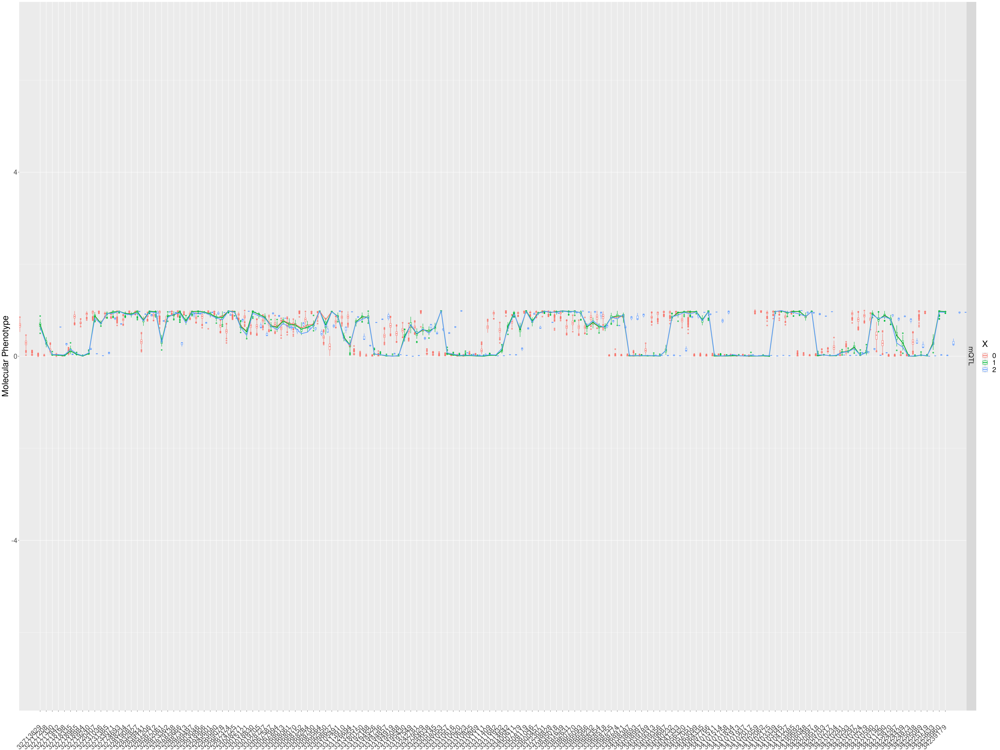

In [66]:
rbind(m_1182_resid_plot_box%>%mutate(type = "mQTL"))%>%ggplot(aes(x = peak, color = X, y = count ))+geom_boxplot(position=position_dodge(10), size = 0.5 , alpha = 0.7 )+stat_summary(fun=median, geom="line", aes(group = X,color = X,x = peak),size = 1)+ 
         theme(text = element_text(size = 25), axis.text.x = element_text(angle = 45, vjust = 0.5, hjust=1))+xlab("")+facet_grid(type~.)+ylab("Molecular Phenotype")+ylim(c(-7,7))

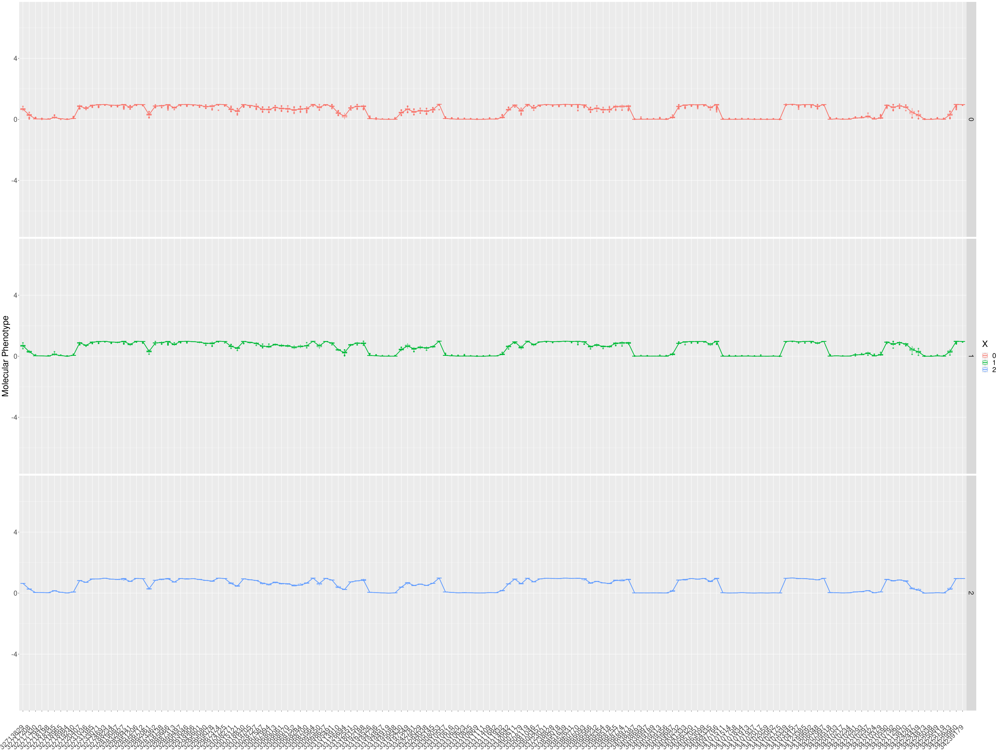

In [67]:
rbind(m_1182_resid_plot_box%>%mutate(type = "mQTL"))%>%filter()%>%ggplot(aes(x = peak, color = X, y = count ))+geom_boxplot(position=position_dodge(10), size = 0.5 , alpha = 0.7 )+stat_summary(fun=median, geom="line", aes(group = X,color = X,x = peak),size = 1)+ 
         theme(text = element_text(size = 25), axis.text.x = element_text(angle = 45, vjust = 0.5, hjust=1))+xlab("")+facet_grid(X~.)+ylab("Molecular Phenotype")+ylim(c(-7,7))

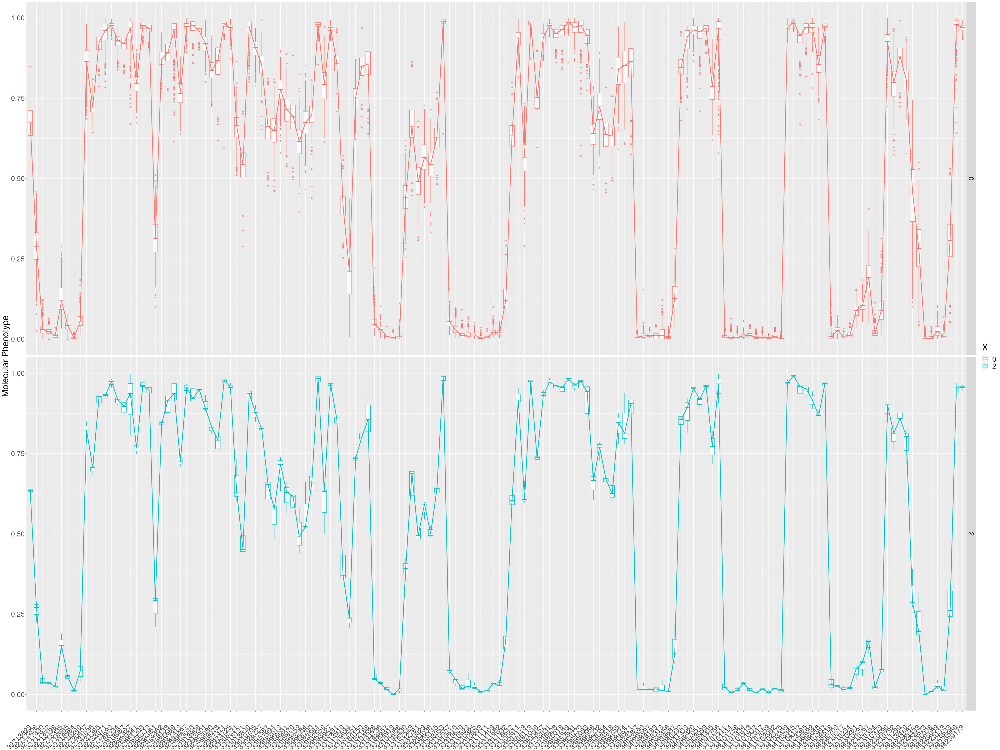

In [72]:
rbind(m_1182_resid_plot_box%>%mutate(type = "mQTL"))%>%filter(X != 1)%>%ggplot(aes(x = peak, color = X, y = count ))+geom_boxplot(position=position_dodge(10), size = 0.5 , alpha = 0.7 )+stat_summary(fun=median, geom="line", aes(group = X,color = X,x = peak),size = 1)+ 
         theme(text = element_text(size = 25), axis.text.x = element_text(angle = 45, vjust = 0.5, hjust=1))+xlab("")+facet_grid(X~.)+ylab("Molecular Phenotype")

Warning message:
“Removed 83070 rows containing missing values (`stat_boxplot()`).”
Warning message:
“Removed 83070 rows containing non-finite values (`stat_summary()`).”


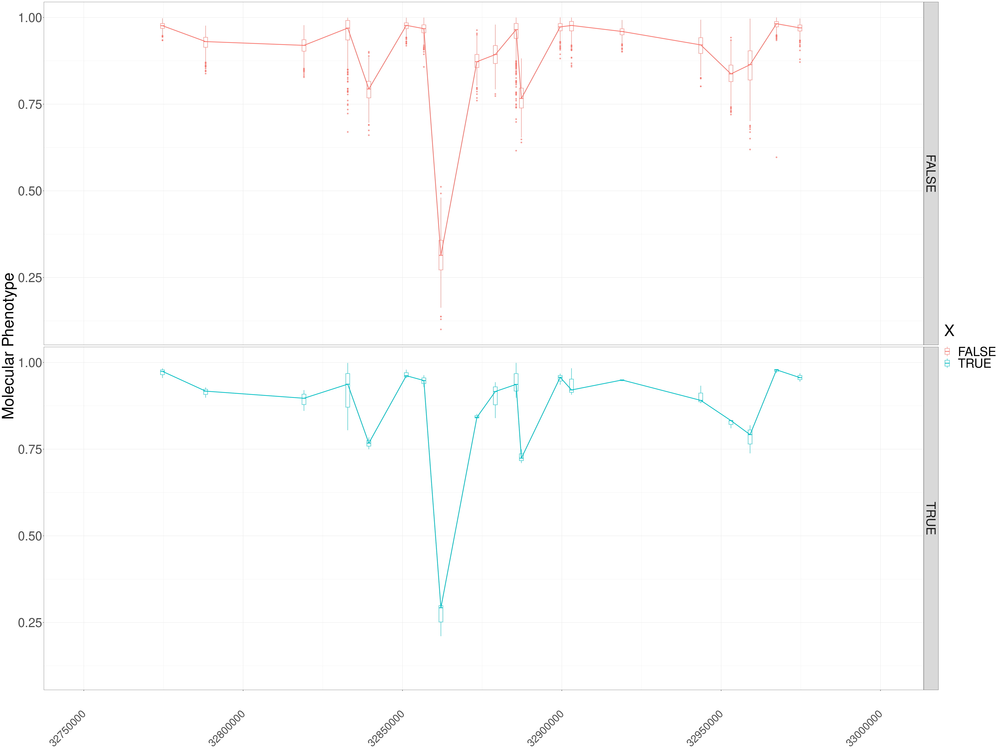

In [69]:
rbind(m_1182_resid_plot_box%>%mutate(type = "mQTL"))%>%mutate(X = X == 2, peak_pos = as.numeric(peak))%>%
    ggplot(aes(x = peak_pos, color = X, y = count , group = peak))+
    geom_boxplot(aes(x = peak_pos, color = X, y = count , group = peak),position=position_dodge(10), size = 0.5 , alpha = 0.7 )+
    stat_summary(fun=median, geom="line", aes(group = X,color = X,x = peak_pos),size = 1)+ 
    theme_bw()+theme(text = element_text(size = 45),panel.background = element_rect(), axis.text.x = element_text(angle = 45, vjust = 0.5, hjust=1,size = 30))+
    xlab("")+facet_grid(X~.)+ylab("Molecular Phenotype")+ xlim(c(32750000,33001000))

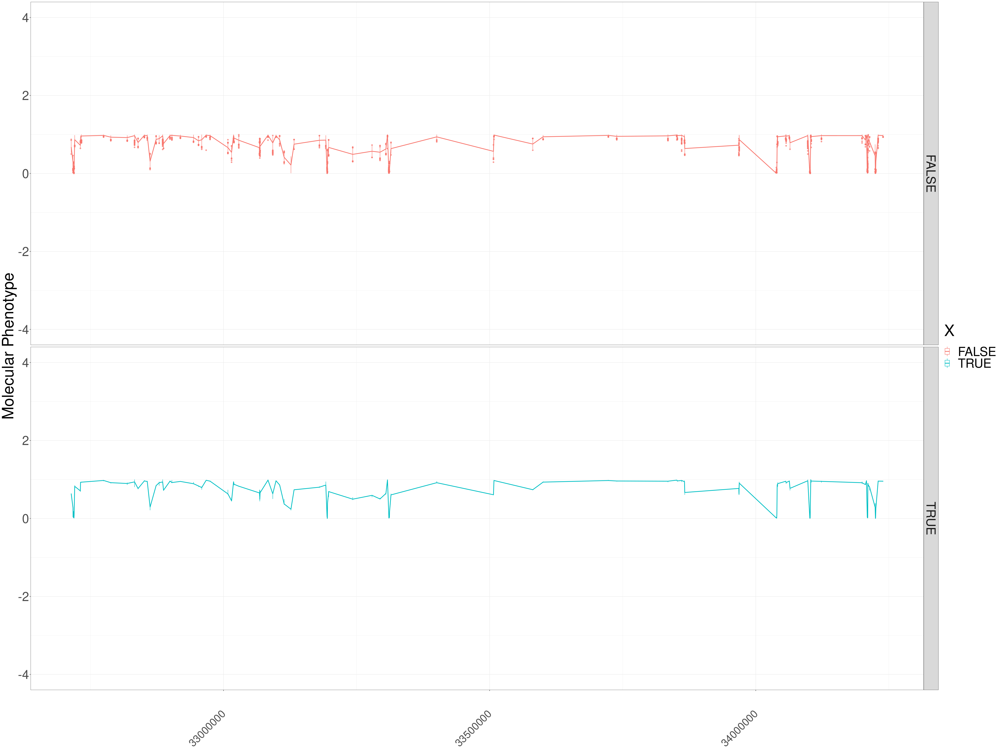

In [70]:
rbind(m_1182_resid_plot_box%>%mutate(type = "mQTL"))%>%mutate(X = X == 2, peak_pos = as.numeric(peak))%>%
    ggplot(aes(x = peak_pos, color = X, y = count , group = peak))+
    geom_boxplot(aes(x = peak_pos, color = X, y = count , group = peak),position=position_dodge(10), size = 0.5 , alpha = 0.7 )+
    stat_summary(fun=median, geom="line", aes(group = X,color = X,x = peak_pos),size = 1)+ 
    theme_bw()+theme(text = element_text(size = 45),panel.background = element_rect(), axis.text.x = element_text(angle = 45, vjust = 0.5, hjust=1,size = 30))+
    xlab("")+facet_grid(X~.)+ylab("Molecular Phenotype")+ylim(c(-4,4))

In [71]:
m_1182_resid_plot_box%>%write_delim("~/GIT/neuro-mQTL/notebook/tad1182_raw.beta.tsv","\t")

In [ ]:
a = read_delim("~/GIT/neuro-mQTL/notebook/3_1182plot.tsv","\t")

In [ ]:
a%>%count(rs35060601)

In [ ]:
b = read_delim("~/GIT/neuro-mQTL/notebook/tad1182_raw.beta.tsv","\t")

In [ ]:
 glm(  b$count~as.factor(b$X),family = "binomial")$coefficients

In [ ]:
(lm(  b$count~as.factor(b$X))%>%summary())$coefficients

In [ ]:
( glm( b$count  ~ as.factor(b$X),family = "quasibinomial")%>%summary())$coefficients


In [ ]:
( glm( b$count  ~ (b$X),family = "quasibinomial")%>%summary())$coefficients


In [ ]:
( glm( b$count  ~ as.factor(b$X),family = "quasibinomial")%>%summary())$coefficients[3,2]
( glm( b$count  ~ as.factor(b$X),family = "quasibinomial")%>%summary())$coefficients[3,3]

In [ ]:
b%>%group_by(peak)%>%summarize(AG= (glm( count  ~ as.factor(X),family = quasibinomial(link = "logit"))%>%summary())$coefficients[2,3],
GG = (glm( count  ~ as.factor(X),family = quasibinomial(link = "logit"))%>%summary())$coefficients[3,3],
  "Number of G" =         (glm( count  ~ (X),family = quasibinomial(link = "logit"))%>%summary())$coefficients[2,3]  )-> b_result

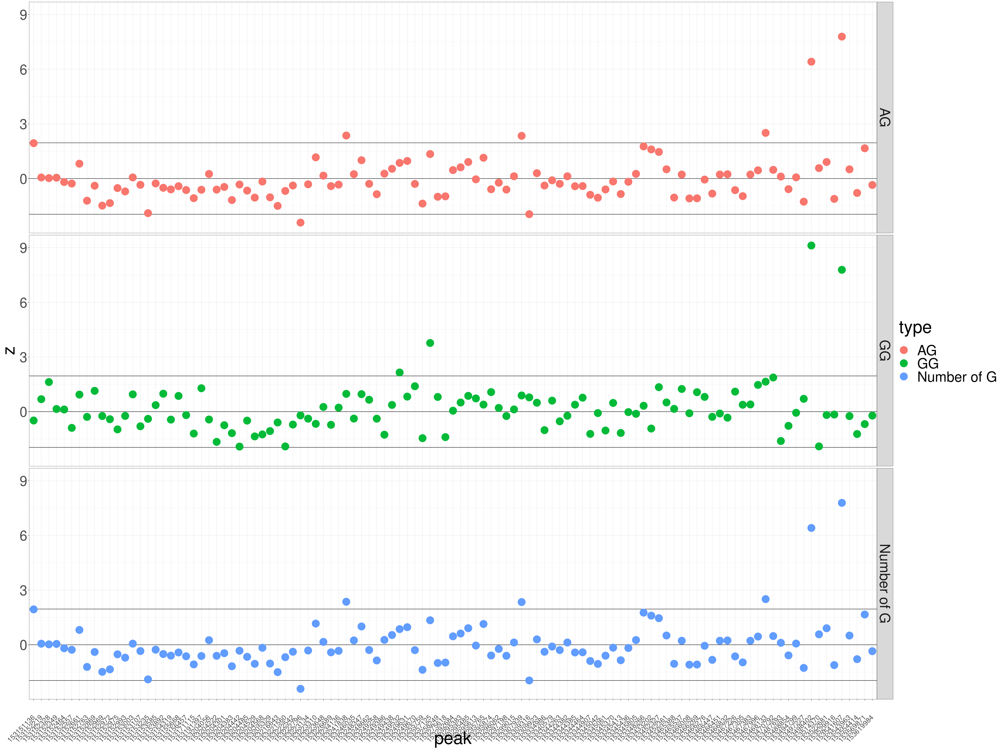

In [89]:
b_result%>%pivot_longer(cols = c("AG","GG","Number of G"),names_to = "type", values_to = "z")%>%mutate(peak = as.factor(peak))%>%ggplot(aes(x = peak))+geom_hline(yintercept  = c(0,1.96,-1.96))+geom_point(size = 10 , aes(y = z,color = type))+theme_bw()+theme(text = element_text(size = 50),axis.text.x =  element_text(angle = 45, vjust = 0.5, hjust=1,size = 20))+facet_grid(type~.)

In [ ]:
(lm(  b$count~as.factor(b$X))%>%summary())$coefficients

Warning message:
“There were 300 warnings in `summarize()`.
The first warning was:
ℹ In argument: `glm1 = glm(count ~ as.factor(X), family =
  "binomial")$coefficients[[2]]`.
ℹ In group 1: `peak = 32713829`.
Caused by warning:
! non-integer #successes in a binomial glm!
ℹ Run `dplyr::last_dplyr_warnings()` to see the 299 remaining warnings.”


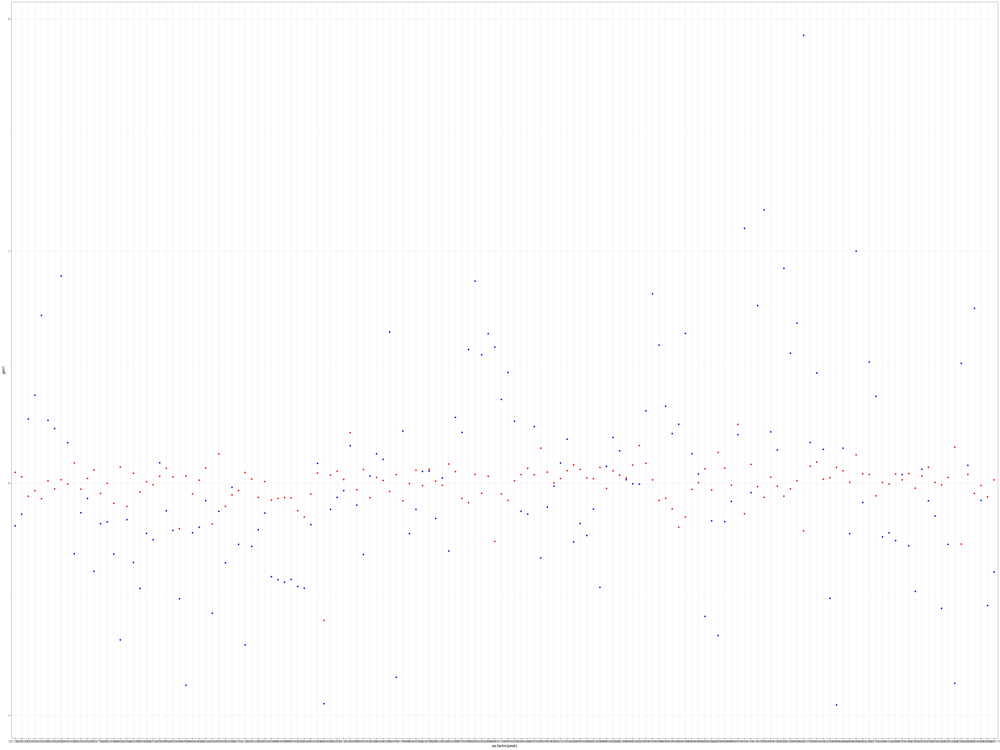

In [182]:
b%>%group_by(peak)%>%summarize(glm1 = glm( count  ~ as.factor(X),family = "binomial")$coefficients[[2]],glm2 = glm( count  ~ as.factor(X),family = "binomial")$coefficients[[3]], lm1 = lm( count  ~ as.factor(X))$coefficients[[2]], lm2 = lm( count  ~ as.factor(X))$coefficients[[3]])%>%ggplot(aes(x = as.factor(peak)))+geom_point(aes(y = glm1),color = "red" ) + geom_point(aes(y = glm2),color = "blue" ) + theme_bw()

Warning message:
“There were 150 warnings in `summarize()`.
The first warning was:
ℹ In argument: `glm = glm(count ~ (X), family = "binomial")$coefficients[[2]]`.
ℹ In group 1: `peak = 32713829`.
Caused by warning:
! non-integer #successes in a binomial glm!
ℹ Run `dplyr::last_dplyr_warnings()` to see the 149 remaining warnings.”


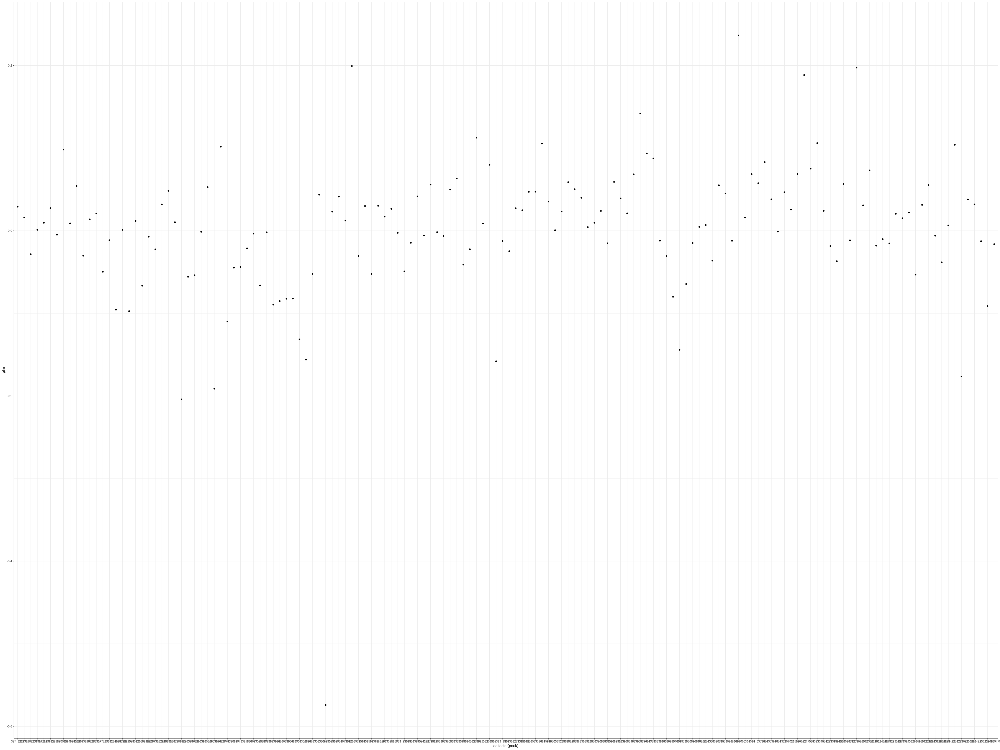

In [172]:
b%>%group_by(peak)%>%summarize(glm = glm( count  ~ (X),family = "binomial")$coefficients[[2]], lm = lm( count  ~ as.factor(X))$coefficients[[2]])%>%ggplot(aes(x = as.factor(peak)))+geom_point(aes(y = glm)) + theme_bw()

Warning message:
“There were 150 warnings in `summarize()`.
The first warning was:
ℹ In argument: `glm = glm(count ~ as.factor(X), family =
  "binomial")$coefficients[[2]]`.
ℹ In group 1: `peak = 32713829`.
Caused by warning:
! non-integer #successes in a binomial glm!
ℹ Run `dplyr::last_dplyr_warnings()` to see the 149 remaining warnings.”


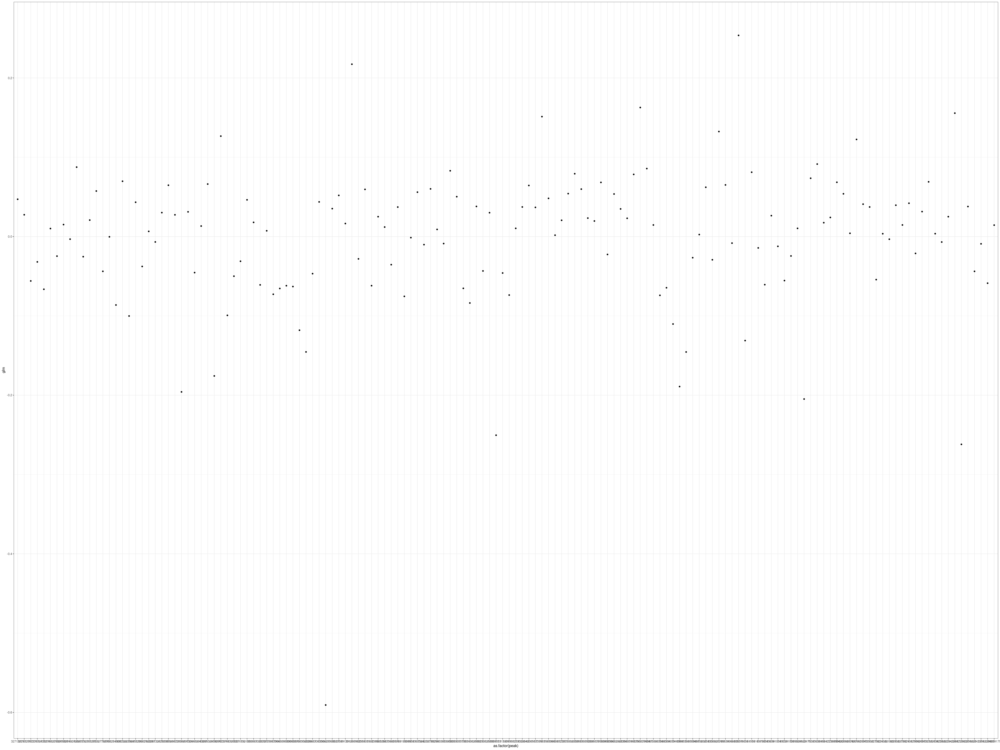

In [171]:
b%>%group_by(peak)%>%summarize(glm = glm( count  ~ as.factor(X),family = "binomial")$coefficients[[2]], lm = lm( count  ~ as.factor(X))$coefficients[[2]])%>%ggplot(aes(x = as.factor(peak)))+geom_point(aes(y = glm)) + theme_bw()

In [ ]:
b%>%group_by(peak)%>%summarize(glm = glm( count  ~ as.factor(X),family = "binomial")$coefficients[[2]], lm = lm( count  ~ as.factor(X))$coefficients[[2]])%>%ggplot(aes(x = as.factor(peak)))+geom_point(aes(y = glm)) 

In [145]:
rbind(m_1182_resid_plot_box%>%mutate(type = "mQTL"))%>%filter(X !=2 )%>%mutate( `rs35060601` = ifelse(X ==2, "GG", "AA" ), peak_pos = as.numeric(peak))%>%write_delim("~/GIT/neuro-mQTL/notebook/3_1182plot.tsv","\t")

In [57]:
rbind(m_1182_resid_plot_box%>%mutate(type = "mQTL"))%>%filter( )%>%mutate( `rs35060601` = ifelse(X ==0, "GG", "AG" ), peak_pos = as.numeric(peak))%>%
    ggplot(aes(x = peak_pos, color = `rs35060601`, y = count , group = peak))+
    geom_boxplot(aes(x = peak, color = `rs35060601`, y = count , group = peak),position=position_dodge(10), size = 0.5 , alpha = 0.7 )+
    stat_summary(fun=median, geom="line", aes(group = X,color = `rs35060601`,x = peak),size = 1)+ 
    theme_bw()+theme(text = element_text(size = 45),panel.background = element_rect(), axis.text.x =  element_text(angle = 45, vjust = 0.5, hjust=1,size = 30))+
    xlab("")+ylab("Molecular Phenotype")+ xlab("")+  scale_x_discrete(breaks = function(x){x[c(TRUE, FALSE,F,F,F)]})

ERROR: Error in mutate(., type = "mQTL"): object 'm_1182_resid_plot_box' not found


In [110]:
m_1182_resid_plot_box_diff = m_1182_resid_plot_box%>%group_by(peak)%>%summarize(count_diff =  m_1182_resid_plot_box%>%filter(X == 2)%>%pull(count) - m_1182_resid_plot_box%>%filter(X != 2)%>%pull(count))

Warning message:
“Returning more (or less) than 1 row per `summarise()` group was deprecated in
dplyr 1.1.0.
ℹ Please use `reframe()` instead.
ℹ When switching from `summarise()` to `reframe()`, remember that `reframe()`
  always returns an ungrouped data frame and adjust accordingly.”
`summarise()` has grouped output by 'peak'. You can override using the
`.groups` argument.


In [122]:
m_1182_resid_plot_box%>%group_by(peak,X)%>%summarize(median = median(count))%>%ungroup%>%group_by(peak)%>%summarize(diff = median[X==2] - median[X == 0]  )

`summarise()` has grouped output by 'peak'. You can override using the
`.groups` argument.


peak,diff
<chr>,<dbl>
32713829,-0.040099591
32717208,-0.018402869
32717330,0.008166275
32717942,0.011529000
32718198,0.014858000
32718335,0.032315822
32718965,0.012413000
32718984,0.007690244
32719240,0.016991008


`summarise()` has grouped output by 'peak'. You can override using the
`.groups` argument.


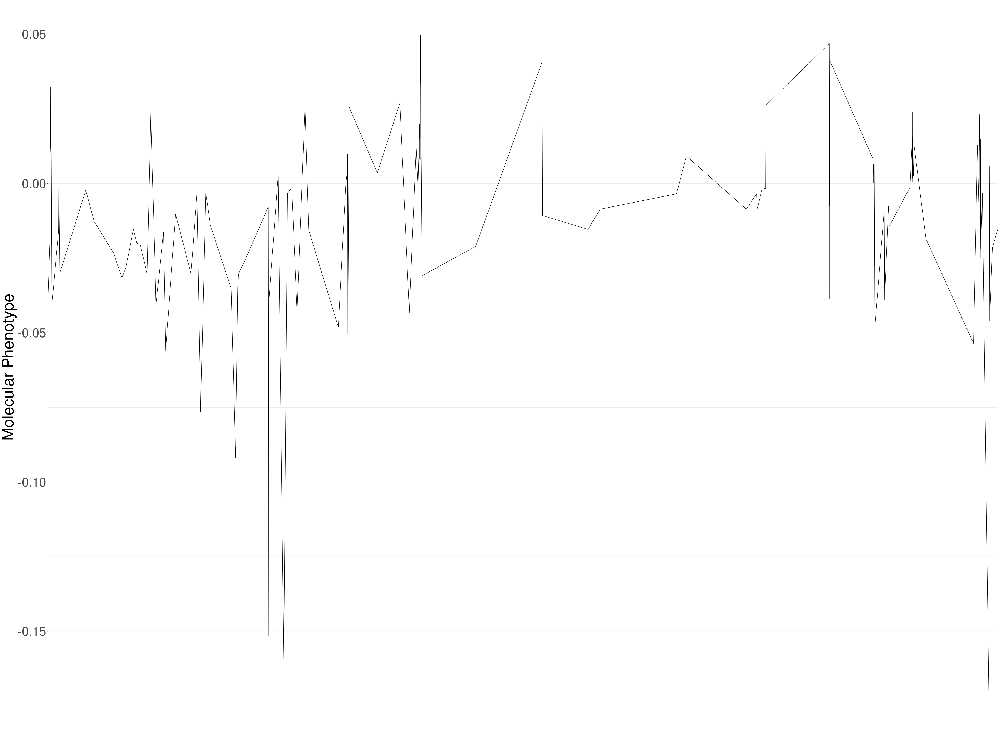

In [129]:
m_1182_resid_plot_box%>%group_by(peak,X)%>%summarize(median = median(count))%>%ungroup%>%group_by(peak)%>%summarize(diff = median[X==2] - median[X == 0]  )%>%mutate(peak_pos = as.numeric(peak))%>%
    ggplot(aes(x = peak_pos,  y = diff ))+ geom_line()+
    #geom_boxplot(aes(x = peak, color = `rs35060601`, y = count , group = peak),position=position_dodge(10), size = 0.5 , alpha = 0.7 )+
    #stat_summary(fun=median, geom="line", aes(x = peak),size = 1)+ 
    theme_bw()+theme(text = element_text(size = 45),panel.background = element_rect(), axis.text.x =  element_text(angle = 45, vjust = 0.5, hjust=1,size = 30))+
    xlab("")+ylab("Molecular Phenotype")+ xlab("")+  scale_x_discrete(breaks = function(x){x[c(TRUE, FALSE,F,F,F)]})

## TAD 8=

## TAD 435

In [97]:
h16 = read_delim("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/haQTL_pure_completed_unlimited_16.tsv")
m16 = read_delim("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/meQTL_pure_completed_unlimited_16.tsv")

Rows: 25937 Columns: 14
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (4): variants, ref, alt, molecular_trait_id
dbl (10): snps_index, chromosome, position, cs_order, pip, finemapped_region...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 65155 Columns: 14
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (4): variants, ref, alt, molecular_trait_id
dbl (10): snps_index, chromosome, position, cs_order, pip, finemapped_region...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [98]:
h16%>%filter(molecular_trait_id == "tad435",cs_order == 1)%>%arrange(-pip)

variants,snps_index,chromosome,position,ref,alt,cs_order,pip,molecular_trait_id,finemapped_region_start,finemapped_region_end,purity,is_dummy,effect_peak_pos
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr4:153536903_C_T,1028,4,153536903,C,T,1,0.16723743,tad435,153120000,153680000,0.995061,0,153618902
chr4:153537319_AAG_A,1030,4,153537319,AAG,A,1,0.16723743,tad435,153120000,153680000,0.995061,0,153618902
chr4:153538553_C_CT,1031,4,153538553,C,CT,1,0.16723743,tad435,153120000,153680000,0.995061,0,153618902
chr4:153538806_C_G,1033,4,153538806,C,G,1,0.16723743,tad435,153120000,153680000,0.995061,0,153618902
chr4:153538959_C_T,1035,4,153538959,C,T,1,0.16723743,tad435,153120000,153680000,0.995061,0,153618902
chr4:153539093_G_A,1036,4,153539093,G,A,1,0.07989376,tad435,153120000,153680000,0.995061,0,153618902
chr4:153539319_A_G,1038,4,153539319,A,G,1,0.04295032,tad435,153120000,153680000,0.995061,0,153618902


In [ ]:
tad435_h = raw_data_proc("tad435","/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/phenotype_list", "/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/covar_list"  ,"chr4",153120000,153680000)

In [189]:
tad435_m = raw_data_proc("tad435","/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/methy_phenotype_list", "/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/methy_covar_list"  ,"chr4",153120000,153680000)

Rows: 1 Columns: 2
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): tissue, path

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 1 Columns: 2
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): tissue, path

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 77 Columns: 640
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr   (1): #id
dbl (639): SM-CTDSC, SM-CJFPD, SM-CJIXK, SM-CTEET, SM-CJIYJ, SM-CTEMG, SM-CJ...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] "Dimension of X matrix: 1160 1354"
[1] "Dimension of Y matrix: 119 639"


numeric(0)

In [192]:
cor(tad435_m$X[,h16%>%filter(molecular_trait_id == "tad435",cs_order == 1)%>%pull("variants")])

,chr4:153536903_C_T,chr4:153537319_AAG_A,chr4:153538553_C_CT,chr4:153538806_C_G,chr4:153538959_C_T,chr4:153539093_G_A,chr4:153539319_A_G
chr4:153536903_C_T,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000,0.9978078,0.9978078
chr4:153537319_AAG_A,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000,0.9978078,0.9978078
chr4:153538553_C_CT,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000,0.9978078,0.9978078
chr4:153538806_C_G,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000,0.9978078,0.9978078
chr4:153538959_C_T,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000,0.9978078,0.9978078
chr4:153539093_G_A,0.9978078,0.9978078,0.9978078,0.9978078,0.9978078,1.0000000,0.9956076
chr4:153539319_A_G,0.9978078,0.9978078,0.9978078,0.9978078,0.9978078,0.9956076,1.0000000


In [101]:
m_435_resid = tad435_m$Y%>%as_tibble%>%`colnames<-`(tad435_m$pos)%>%mutate(X =  tad435_m$X[,"chr4:153536903_C_T"] )

In [193]:
m_435_resid = tad435_m$Y%>%as_tibble%>%`colnames<-`(tad435_m$pos)%>%mutate(X =  tad435_m$X[,"chr4:153539093_G_A"] )

In [102]:
h_435_resid = tad435_h$Y%>%as_tibble%>%`colnames<-`(tad435_h$pos)%>%mutate(X =  tad435_h$X[,"chr4:153536903_C_T"] )

ERROR: Error in as_tibble(.): object 'tad435_h' not found


In [194]:
m_435_resid_plot = raw_data_plot_prep(m_435_resid,mQTL_affected_region ,"tad435")

`summarise()` has grouped output by 'X'. You can override using the `.groups`
argument.


In [43]:
h_435_resid_plot = raw_data_plot_prep(h_435_resid,haQTL_affected_region ,"tad435")

`summarise()` has grouped output by 'X'. You can override using the `.groups`
argument.


In [104]:
rbind(h_435_resid_plot%>%mutate(type = "haQTL"),m_435_resid_plot%>%mutate(type = "mQTL"))%>%ggplot()+geom_line(aes(x = as.numeric(peak), color = X, y = mean_count ),size = 3 )+ 
         theme(text = element_text(size = 25))+xlim(c(153120000,153680000))+xlab("")+facet_grid(type~.)+ylab("Mean Molecular Phenotype")

ERROR: Error in mutate(., type = "haQTL"): object 'h_435_resid_plot' not found


## Boxplot at peak region

In [105]:
m_435_resid_plot_box = raw_data_box_plot_prep(m_435_resid,mQTL_affected_region ,"tad435", 4)#%>%filter(as.numeric(peak) > 142600000, as.numeric(peak) < 142750000  )


In [46]:
h_435_resid_plot_box = raw_data_box_plot_prep(h_435_resid,haQTL_affected_region ,"tad435", 1)#%>%filter(as.numeric(peak) > 142600000, as.numeric(peak) < 142750000  )

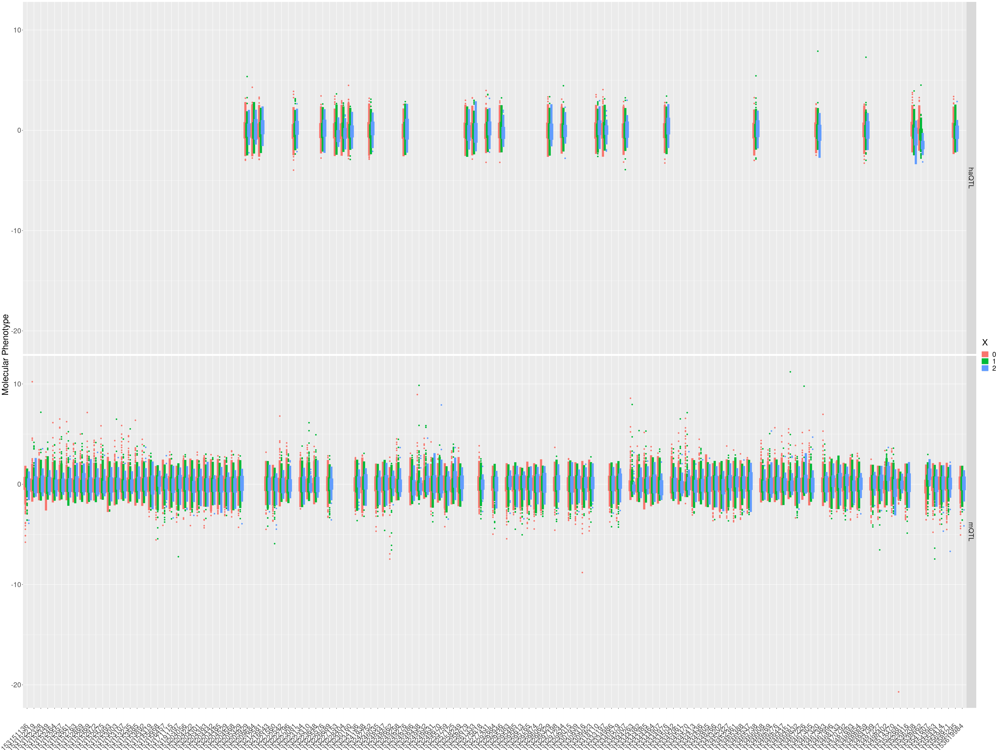

In [47]:
rbind(h_435_resid_plot_box%>%mutate(type = "haQTL"),m_435_resid_plot_box%>%mutate(type = "mQTL"))%>%ggplot()+geom_boxplot(aes(x = peak, color = X, y = count ), size = 3 )+ 
         theme(text = element_text(size = 25), axis.text.x = element_text(angle = 45, vjust = 0.5, hjust=1))+xlab("")+facet_grid(type~.)+ylab("Molecular Phenotype")

In [24]:
h16%>%filter(molecular_trait_id == "tad435")

variants,snps_index,chromosome,position,ref,alt,cs_order,pip,molecular_trait_id,finemapped_region_start,finemapped_region_end,purity,is_dummy,effect_peak_pos
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr4:153169893_G_A,172,4,153169893,G,A,3,0.49512148,tad435,153120000,153680000,1.0000000,0,153322281
chr4:153169959_C_T,173,4,153169959,C,T,3,0.49512148,tad435,153120000,153680000,1.0000000,0,153322281
chr4:153213451_A_T,322,4,153213451,A,T,2,0.02316415,tad435,153120000,153680000,0.9679846,0,153377925
chr4:153218154_T_C,338,4,153218154,T,C,2,0.11500614,tad435,153120000,153680000,0.9679846,0,153377925
chr4:153218994_AC_A,341,4,153218994,AC,A,2,0.06642662,tad435,153120000,153680000,0.9679846,0,153377925
chr4:153220974_T_C,348,4,153220974,T,C,2,0.31753700,tad435,153120000,153680000,0.9679846,0,153377925
chr4:153221021_A_C,349,4,153221021,A,C,2,0.30381506,tad435,153120000,153680000,0.9679846,0,153377925
chr4:153221107_A_G,350,4,153221107,A,G,2,0.14127010,tad435,153120000,153680000,0.9679846,0,153377925
chr4:153536903_C_T,1028,4,153536903,C,T,1,0.16723743,tad435,153120000,153680000,0.9950610,0,153618902


In [118]:
m_435_resid

153127095,153128048,153128060,153137231,153151136,153152219,153152328,153152349,153152464,153152557,⋯,153522681,153529916,153541607,153543963,153554414,153569871,153594465,153619984,153651678,X
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.9586331,0.118833,0.0587040830,0.8110969,0.9631881,2.151215e-02,0.009764,0.026884,0.030236725,1.492136e-02,⋯,0.9542179,0.9249136,0.8186638,0.9608781,0.9430130,0.9952087,0.8711909,0.9636356,0.4889037,0
0.9436458,0.067494,0.0067846689,0.7012785,0.9864570,5.128197e-03,0.000038,0.000038,0.027247048,2.182941e-03,⋯,0.9714150,0.9324955,0.8383970,0.9652951,0.9362893,0.9694409,0.8318912,0.9776242,0.5478913,1
0.9454024,0.114427,0.0139606488,0.6799910,0.9510299,1.149825e-02,0.014810,0.018376,0.006209330,2.920076e-03,⋯,0.9754844,0.8870772,0.9001825,0.9875026,0.9476075,0.9796458,0.8191038,0.8829833,0.4758556,1
0.9629610,0.038365,0.0113190233,0.8415718,0.9757222,6.816707e-03,0.000036,0.032493,0.034864345,1.594245e-02,⋯,0.9855098,0.9783088,0.8983800,0.9816647,0.9799869,0.9670668,0.9438532,0.9154155,0.5616493,1
0.9466658,0.154981,0.0608599495,0.7943245,0.9305941,6.504267e-05,0.006934,0.000047,0.032342979,6.539446e-04,⋯,0.9807105,0.9268600,0.8320365,0.9541094,0.9783603,0.9802695,0.8867985,0.9957407,0.5103777,0
0.9772106,0.040963,0.0280256428,0.7112057,0.9947633,1.456204e-03,0.005353,0.000046,0.031521537,4.545538e-03,⋯,0.9710830,0.8783481,0.8875420,0.9442460,0.9409579,0.9839154,0.7878293,0.8360903,0.5007071,0
0.9732579,0.101206,0.0038346451,0.6516586,0.9959210,3.697310e-03,0.015808,0.016591,0.014263284,2.527121e-03,⋯,0.9748498,0.9341886,0.8632230,0.9486703,0.9527538,0.9214995,0.8125126,0.9030078,0.5009975,1
0.9318332,0.124266,0.0535402393,0.7649669,0.9617033,2.957150e-02,0.010310,0.028954,0.017688055,2.940753e-02,⋯,0.9792509,0.8772034,0.7598482,0.9699117,0.9233816,0.9594827,0.8833876,0.9183144,0.4485764,0
0.9593528,0.007930,0.0002206681,0.7435271,0.9877288,1.768151e-03,0.000041,0.000041,0.008595336,1.384200e-03,⋯,0.9570781,0.9560530,0.7993348,0.9635323,0.9438918,0.9950110,0.8463126,0.9211776,0.4839041,0


In [14]:
raw435_h = readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/rerun/cache/fsusie.rosmap_haqtl.tad435.uni_Fsusie.mixture_normal_per_scale.rds")

In [15]:
raw435_m = readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/rerun/cache/fsusie.yuqi_mqtl.tad435.uni_Fsusie.mixture_normal_per_scale.rds")

In [20]:
raw435_m$cs

[[1]]
chr4:153593695_T_C 
              1102 

[[2]]
chr4:153498419_T_A 
               993 

[[3]]
chr4:153594426_AC_A 
               1110 

[[4]]
  chr4:153539263_G_A   chr4:153539930_G_T   chr4:153539319_A_G 
                1037                 1040                 1038 
  chr4:153540978_C_G   chr4:153536903_C_T chr4:153537319_AAG_A 
                1043                 1028                 1030 
 chr4:153538553_C_CT   chr4:153538806_C_G   chr4:153538959_C_T 
                1031                 1033                 1035 

[[5]]
chr4:153453257_T_G 
               899 

[[6]]
chr4:153210363_G_C 
               315 

[[7]]
      chr4:153172312_C_T chr4:153175012_GTTTTGT_G      chr4:153175016_TG_* 
                     189                      202                      203 
      chr4:153172256_T_C       chr4:153173523_G_A       chr4:153173530_C_T 
                     188                      198                      199 
     chr4:153171640_GA_G       chr4:153172849_A_G       chr4:153172955_G_C 
                     178                      192                      194 
      chr4:153172957_G_C       chr4:153173641_C_T       chr4:153179048_A_G 
                     195                      200                      219 
      chr4:153170803_T_C    chr4:153171649_GATA_G       chr4:153171656_C_T 
                     177                      179                      180 
      chr4:153178130_T_C       chr4:153178346_T_C       chr4:153173921_T_C 
                     215                      217                      201 
      chr4:153173083_C_G 
                     197

In [199]:
raw_data_box_plot_prep

function(df,region_df,tad,CS){
df = df[,colnames(df) %in% c(region_df%>%filter(molecular_trait_id == tad, CS == CS )%>%pull(start), "X")]%>%
    mutate(X = as.factor(round(X)))%>%pivot_longer(cols = 1:(ncol(.)-1), names_to = "peak", values_to = "count" )%>%
    group_by(X,peak)
return(df)
}
<bytecode: 0x55ff3dbbb7d8>

In [108]:
m_435_resid_plot_box = raw_data_box_plot_prep(m_435_resid,mQTL_affected_region ,"tad435", 3)#%>%filter(as.numeric(peak) > 142600000, as.numeric(peak) < 142750000  )

In [109]:
table(tad435_m$X[,"chr4:153169893_G_A"])


  0   1   2 
100 305 234 

In [110]:
tibble(value = tad435_m$X[,"chr4:153169893_G_A"], sample = names(tad435_m$X[,"chr4:153169893_G_A"]))

value,sample
<dbl>,<chr>
1,SM-CTDSC
2,SM-CJFPD
2,SM-CJIXK
0,SM-CTEET
2,SM-CJIYJ
1,SM-CTEMG
1,SM-CJIZ4
1,SM-CTDR8
1,SM-CJK46


In [224]:
m_435_resid = tad435_m$Y%>%as_tibble%>%`colnames<-`(tad435_m$pos)%>%mutate(X =  tad435_m$X[,"chr4:153169893_G_A"] )

In [225]:
cor(tad435_m$X[,"chr4:153539093_G_A"], tad435_m$X[,"chr4:153169959_C_T"] )

[1] 0.07068667

In [226]:
m16%>%filter(molecular_trait_id == "tad435")%>%arrange(position)

variants,snps_index,chromosome,position,ref,alt,cs_order,pip,molecular_trait_id,finemapped_region_start,finemapped_region_end,purity,is_dummy,effect_peak_pos
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr4:153169893_G_A,172,4,153169893,G,A,8,0.49355374,tad435,153120000,153680000,1.0000000,0,153221808
chr4:153169959_C_T,173,4,153169959,C,T,8,0.49355374,tad435,153120000,153680000,1.0000000,0,153221808
chr4:153170803_T_C,177,4,153170803,T,C,7,0.02520389,tad435,153120000,153680000,0.7827986,0,153242386
chr4:153171640_GA_G,178,4,153171640,GA,G,7,0.04933917,tad435,153120000,153680000,0.7827986,0,153242386
chr4:153171649_GATA_G,179,4,153171649,GATA,G,7,0.02376274,tad435,153120000,153680000,0.7827986,0,153242386
chr4:153171656_C_T,180,4,153171656,C,T,7,0.02376274,tad435,153120000,153680000,0.7827986,0,153242386
chr4:153172256_T_C,188,4,153172256,T,C,7,0.06596342,tad435,153120000,153680000,0.7827986,0,153242386
chr4:153172312_C_T,189,4,153172312,C,T,7,0.28776444,tad435,153120000,153680000,0.7827986,0,153242386
chr4:153172849_A_G,192,4,153172849,A,G,7,0.04074843,tad435,153120000,153680000,0.7827986,0,153242386


In [227]:
m_435_resid_plot_box = raw_data_box_plot_prep(m_435_resid,mQTL_affected_region ,"tad435", 8)#%>%filter(as.numeric(peak) > 142600000, as.numeric(peak) < 142750000  )

In [258]:
as.numeric(m_435_resid_plot_box$peak)%>%quantile

0%       25%       50%       75%      100% 
153151136 153204442 153292684 153452361 153619984

In [ ]:
chr4:153169959_C_T	

In [323]:
options(repr.plot.width =15, repr.plot.height = 15)

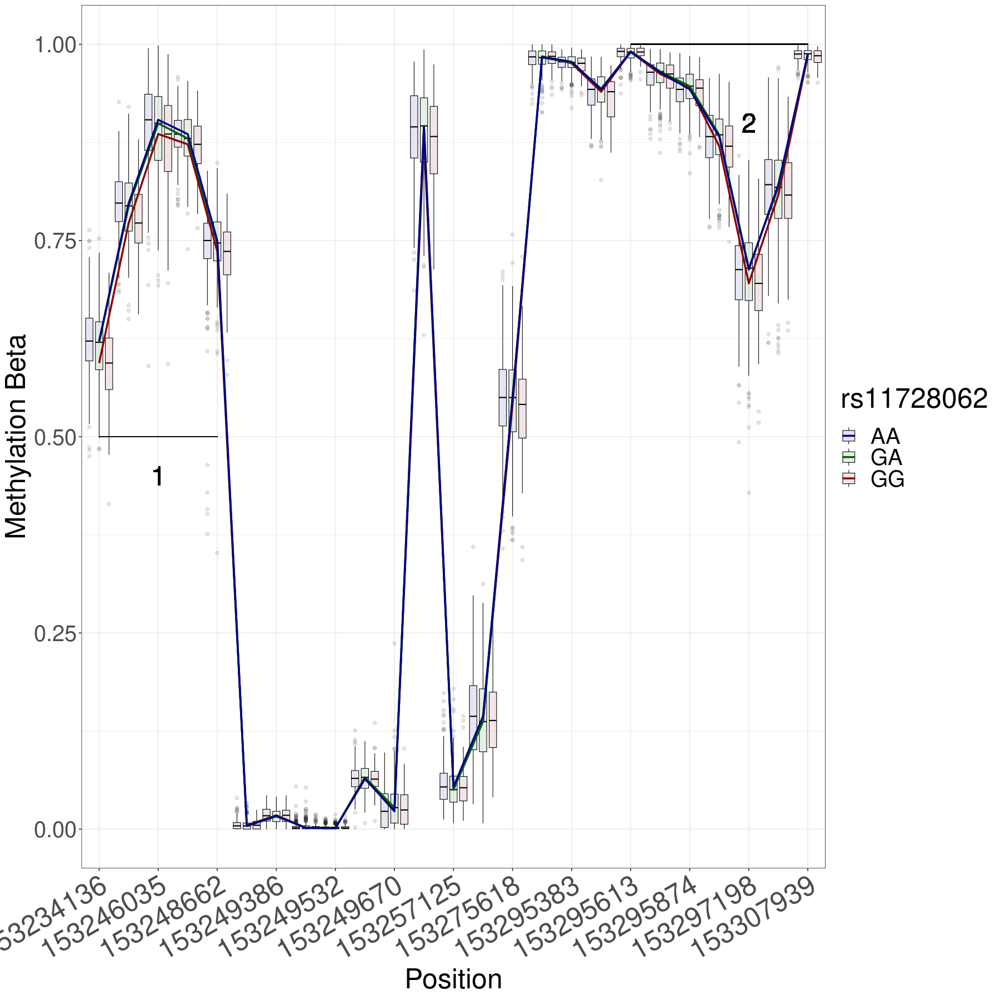

In [326]:
m_435_resid_plot_box%>%mutate( `rs11728062` = case_when(X ==0~ "GG", X ==1 ~ "GA", X == 2 ~ "AA" ), peak_pos = as.numeric(peak))%>%filter(peak_pos > 153226689 ,peak_pos < 153309316 )%>%
    ggplot(aes(x = peak_pos, color = `rs11728062`, y = count ))+
    geom_boxplot(aes(x = peak, fill = `rs11728062`, y = count ),position=position_dodge(1), size = 0.3,color = "black" , alpha = 0.1)+
   stat_summary(fun=median, geom="line", aes(group = X ,color = `rs11728062`,x = peak),size = 1)+ 
    theme_bw()+theme(text = element_text(size = 30),panel.background = element_rect(), axis.text.x =  element_text(angle = 30,  hjust=1,size = 30))+
    xlab("")+ylab("Methylation Beta")+ xlab("Position")+scale_fill_discrete(type = c("darkblue","darkgreen","darkred"))+scale_color_discrete(type = c("darkblue","darkgreen","darkred"))+  scale_x_discrete(breaks = function(x){x[c(TRUE, FALSE)]})+geom_segment(aes(x = "153234136",xend = "153248662", y = 0.5,yend = 0.5),color = "black")+geom_text(aes(x="153297198",y = 0.9,label = "2"),color = "black", size = 10)+geom_text(aes(x="153246035",y = 0.45,label = "1"),color = "black", size = 10)+geom_segment(aes(x = "153295613",xend = "153307939", y = 1,yend = 1),color = "black") 

In [283]:
scale_fill_discrete

function (..., type = getOption("ggplot2.discrete.fill")) 
{
    type <- type %||% scale_fill_hue
    if (is.function(type)) {
        check_scale_type(type(...), "scale_fill_discrete", "fill", 
            scale_is_discrete = TRUE)
    }
    else {
        scale_fill_qualitative(..., type = type)
    }
}
<bytecode: 0x55ff34e1a1b0>
<environment: namespace:ggplot2>

In [230]:
m_435_resid_plot_box%>%group_by(peak)%>%summarize(AG= (glm( count  ~ as.factor(X),family = quasibinomial(link = "logit"))%>%summary())$coefficients[2,3],
GG = (glm( count  ~ as.factor(X),family = quasibinomial(link = "logit"))%>%summary())$coefficients[3,3],
  "Number of G" =         (glm( count  ~ (X),family = quasibinomial(link = "logit"))%>%summary())$coefficients[2,3]  )-> b_result

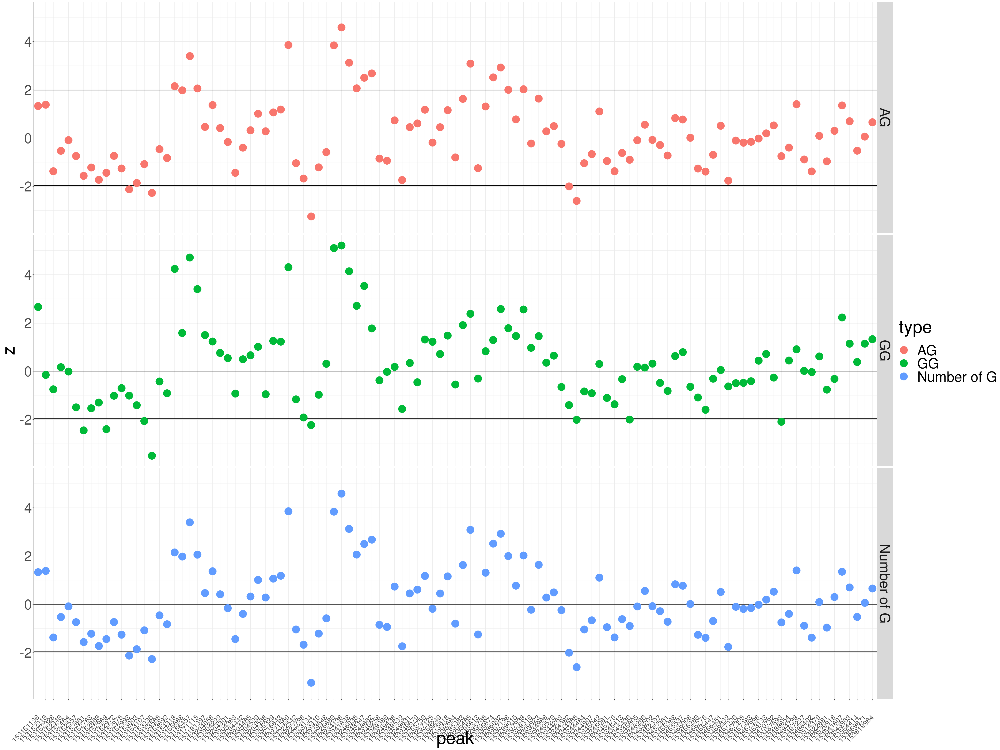

In [235]:
b_result%>%pivot_longer(cols = c("AG","GG","Number of G"),names_to = "type", values_to = "z")%>%mutate(peak = as.factor(peak))%>%ggplot(aes(x = peak))+geom_hline(yintercept  = c(0,1.96,-1.96))+geom_point(size = 10 , aes(y = z,color = type))+theme_bw()+theme(text = element_text(size = 50),axis.text.x =  element_text(angle = 45, vjust = 0.5, hjust=1,size = 20))+facet_grid(type~.)

In [238]:
m_435_resid_plot_box%>%write_delim("~/GIT/neuro-mQTL/notebook/3_435_cs8m.tsv","\t")

## TAD 174

In [29]:
h16 = read_delim("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/haQTL_pure_completed_unlimited_16.tsv")


Rows: 25937 Columns: 14
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (4): variants, ref, alt, molecular_trait_id
dbl (10): snps_index, chromosome, position, cs_order, pip, finemapped_region...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [30]:
h16%>%filter(molecular_trait_id == "tad174",cs_order == 1)%>%arrange(-pip)

variants,snps_index,chromosome,position,ref,alt,cs_order,pip,molecular_trait_id,finemapped_region_start,finemapped_region_end,purity,is_dummy,effect_peak_pos
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr2:86208944_C_A,2204,2,86208944,C,A,1,0.9997709,tad174,85400000,86880000,1,0,86547402


In [31]:
tad174_h = raw_data_proc("tad174","/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/phenotype_list", "/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/covar_list"  ,"chr4",85400000,86880000)

Rows: 1 Columns: 2
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): tissue, path

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 1 Columns: 2
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): tissue, path

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 76 Columns: 593
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr   (1): #id
dbl (592): SM-CJEFU, MAP46251007, SM-CJFNY, SM-CJGNQ, SM-CTDQZ, SM-CJIWY, SM...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] "Dimension of X matrix: 1160 3540"
[1] "Dimension of Y matrix: 32 592"


In [32]:
h16%>%filter(molecular_trait_id == "tad174",cs_order == 1)%>%pull("variants")

[1] "chr2:86208944_C_A"

In [33]:
h16%>%filter(molecular_trait_id == "tad174",cs_order == 1)%>%pull("variants")

[1] "chr2:86208944_C_A"

In [34]:
table(tad174_h$X[,h16%>%filter(molecular_trait_id == "tad174",cs_order == 1)%>%pull("variants")])


  0   1   2 
191 292 109 

In [35]:
h_174_resid = tad174_h$Y%>%as_tibble%>%`colnames<-`(tad174_h$pos)%>%mutate(X =  tad174_h$X[,h16%>%filter(molecular_trait_id == "tad174",cs_order == 1)%>%pull("variants")] )

In [12]:
raw_data_box_plot_prep

ERROR: Error in eval(expr, envir, enclos): object 'raw_data_box_plot_prep' not found


In [ ]:
haQTL_affected_region%>%filter(molecular_trait_id%in% "tad174")

In [40]:
raw_data_box_plot_prep

function(df,region_df,tad,CS){
df = df[,colnames(df) %in% c(region_df%>%filter(molecular_trait_id == tad, CS == CS )%>%pull(start), "X")]%>%
    mutate(X = as.factor(round(X)))%>%pivot_longer(cols = 1:(ncol(.)-1), names_to = "peak", values_to = "count" )%>%
    group_by(X,peak)
return(df)
}

In [41]:
h_174_resid_plot_box = h_174_resid%>% mutate(X = as.factor(round(X))) %>% 
        pivot_longer(cols = 1:(ncol(.) - 1), names_to = "peak", 
            values_to = "count") %>% group_by(X, peak)

In [42]:
h_174_resid_plot = raw_data_plot_prep(h_174_resid,haQTL_affected_region ,"tad175")

`summarise()` has grouped output by 'X'. You can override using the `.groups`
argument.


In [45]:
h_174_resid_plot_box%>%write_delim("~/GIT/neuro-mQTL/notebook/3_174_1_rawdata_plot.tsv","\t")

In [21]:
h_174_resid_plot_box = read_delim("~/GIT/neuro-mQTL/notebook/3_174_1_rawdata_plot.tsv","\t")

In [13]:
chr2:88170344_G_C

ERROR: Error in parse(text = x, srcfile = src): <text>:1:14: unexpected input
1: chr2:88170344_
                 ^


In [14]:
diff(c(9991,444))

[1] -9547

In [15]:
table(h_174_resid$X)


  0   1   2 
191 292 109 

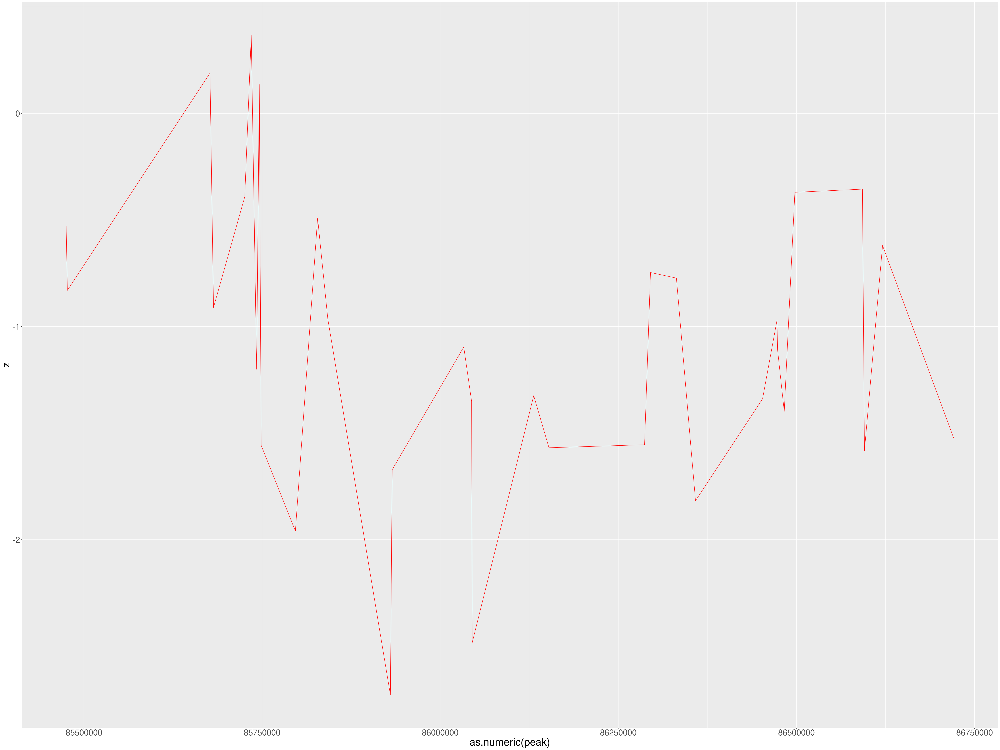

In [47]:
(h_174_resid_plot_box%>%group_by(peak)%>%filter()%>%summarize(z = (lm(count~(X))%>%summary)$coef[3,3]))->b
b%>%ggplot()+geom_line(aes(x = as.numeric(peak), y = z ), color= "red")+theme(text=element_text(size  = 30))

In [ ]:
%>%summarize((lm(count~X)%>%summary)$coef)%>%head

In [86]:
b%>%filter(peak == "86358373")

peak,z
<chr>,<dbl>
86358373,-1.817472


In [48]:
h_174_resid_plot_sum%>%arrange(-abs(diff_median))

peak,diff_mean,diff_median,mean_ratio
<dbl>,<dbl>,<dbl>,<dbl>
88523658,-8.307717898,14.5,0.9746544
89111625,3.233422045,12.0,1.0161104
88696919,-4.200266134,12.0,0.9732278
88457339,2.175205145,9.5,1.0301491
88379092,3.614992238,9.0,1.0271275
88007141,2.083610557,8.0,1.0356737
88231481,-1.886005766,7.0,0.9688740
88820950,-1.892770016,-6.0,0.9831781
88008758,-2.245730761,6.0,0.9857330


In [27]:
h_174_resid_plot%>%group_by(peak)%>%pivot_wider(names_from = "X",values_from = c("mean_count" ,"median_count" ))%>%summarize(diff_mean = mean_count_2 - mean_count_0,diff_median = median_count_2-median_count_0,mean_ratio = mean_count_2/mean_count_0 )%>%arrange(abs(diff_mean))->h_174_resid_plot_sum

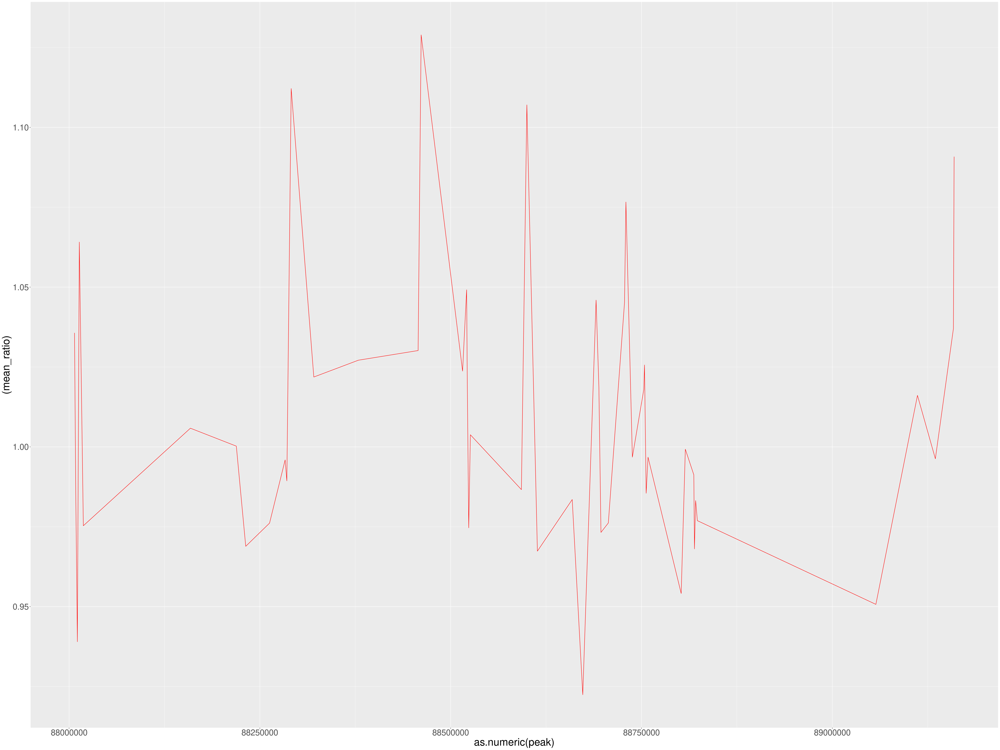

In [28]:
h_174_resid_plot_sum%>%ggplot()+geom_line(aes(x = as.numeric(peak), y = (mean_ratio) ), color= "red")+theme(text=element_text(size  = 30))

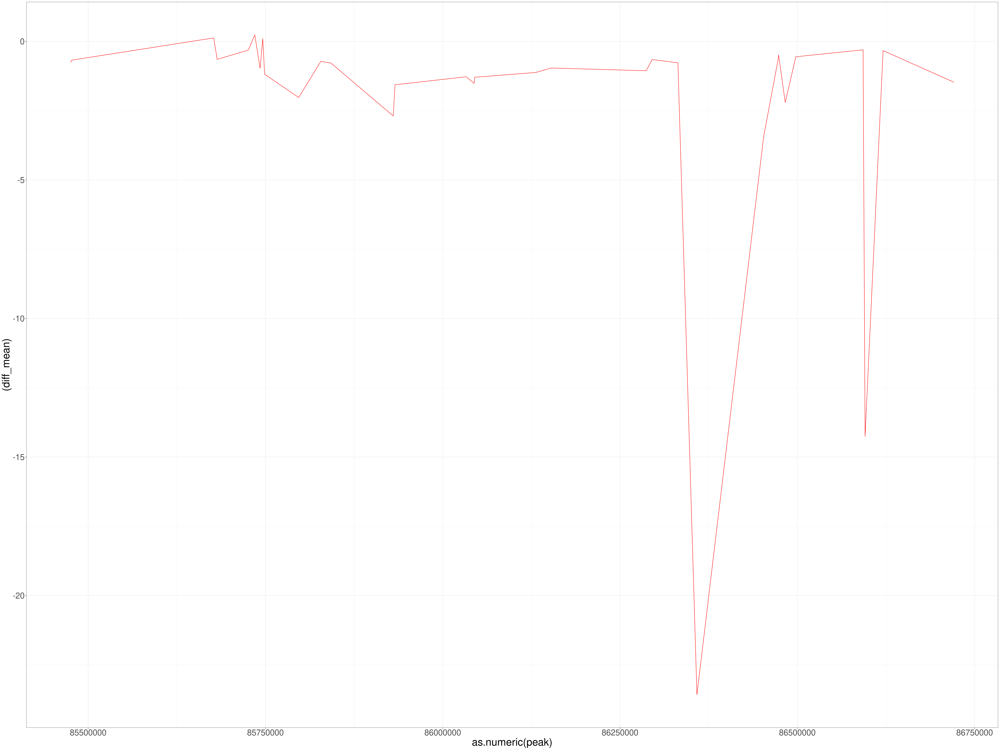

In [177]:
h_174_resid_plot%>%filter( X != 1 )%>%group_by(peak)%>%summarize(diff_mean = diff(mean_count),diff_median = diff(median_count) )%>%
    arrange(-abs(diff_mean))%>%ggplot()+geom_line(aes(x = as.numeric(peak), y = (diff_mean) ), color= "red")+theme_bw()+theme(text=element_text(size  = 30))

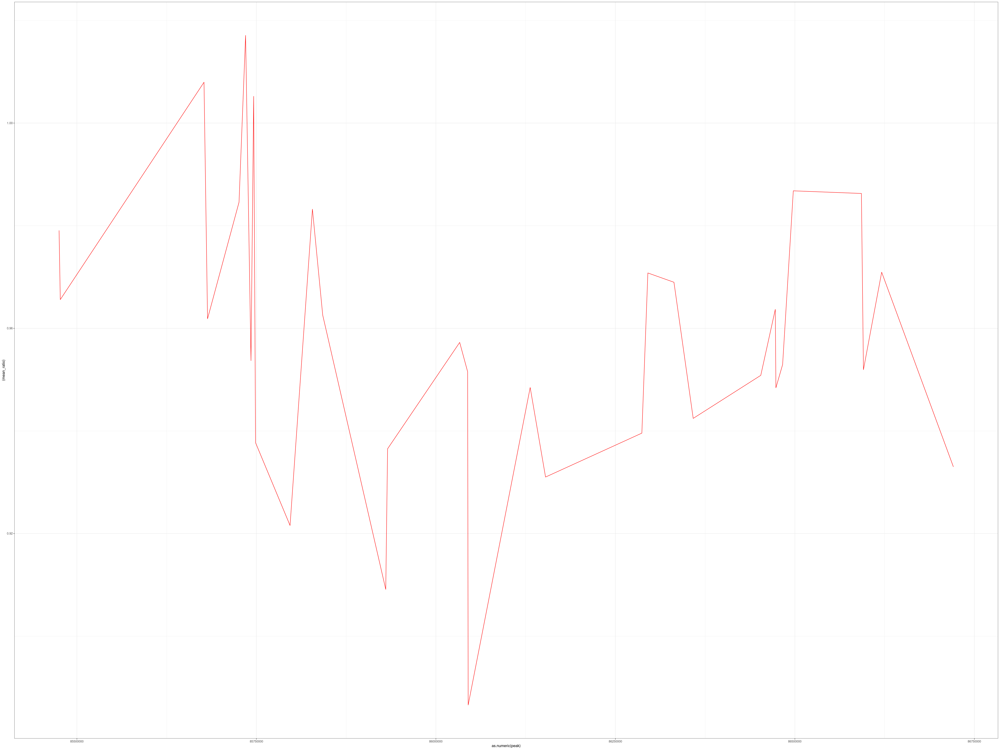

In [176]:
h_174_resid_plot_sum%>%ggplot()+geom_line(aes(x = as.numeric(peak), y = (mean_ratio) ), color= "red")+theme(text=element_text(size  = 30))+theme_bw()

In [50]:
within = function(x,y,z){ return(x >= y & x <= z)}

In [47]:
1%>%within(0.5,1)

[1] TRUE

Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”
`geom_line()`: Each group consists of only one observation.
ℹ Do you need to adjust the group aesthetic?
`geom_line()`: Each group consists of only one observation.
ℹ Do you need to adjust the group aesthetic?
`geom_line()`: Each group consists of only one observation.
ℹ Do you need to adjust the group aesthetic?


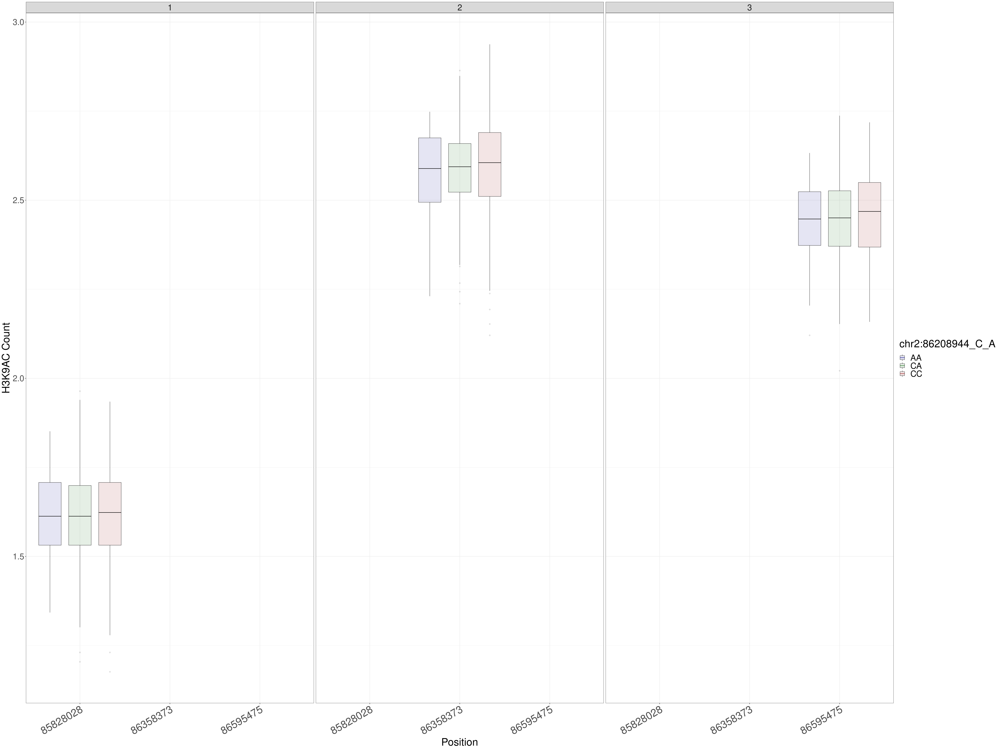

In [51]:
h_174_resid_plot_box%>%filter( )%>%mutate(peak_pos = as.numeric(peak), count = log10(count),group = case_when(peak_pos%>%within(85828028,85828028)~1,peak_pos%>%within(86358373,86358373)~2,peak_pos%>%within(86595475,86595475)~3 , .default = 0) )%>%filter(group != 0 )%>%mutate( `chr2:86208944_C_A` = case_when(X ==0~ "CC", X ==1 ~ "CA", X == 2 ~ "AA" ), peak_pos = as.numeric(peak))%>%
    ggplot(aes(x = peak_pos, color = `chr2:86208944_C_A`, y = count ))+
     geom_boxplot(aes(x = peak, fill = `chr2:86208944_C_A`, y = count ),position=position_dodge(1), size = 0.3,color = "black" , alpha = 0.1)+
    stat_summary(fun=mean, geom="line", aes(group = X ,color = `chr2:86208944_C_A`,x = peak),size = 0.5)+ facet_grid(.~group,scale = "free_y") +
    theme_bw()+theme(text = element_text(size = 30),panel.background = element_rect(), axis.text.x =  element_text(angle = 30,  hjust=1,size = 30))+
    xlab("")+ylab("H3K9AC Count")+ xlab("Position")+scale_fill_discrete(type = c("darkblue","darkgreen","darkred"))+scale_color_discrete(type = c("darkblue","darkgreen","darkred"))+  scale_x_discrete(breaks = function(x){x[c(TRUE, T)]})

`geom_line()`: Each group consists of only one observation.
ℹ Do you need to adjust the group aesthetic?
`geom_line()`: Each group consists of only one observation.
ℹ Do you need to adjust the group aesthetic?
`geom_line()`: Each group consists of only one observation.
ℹ Do you need to adjust the group aesthetic?


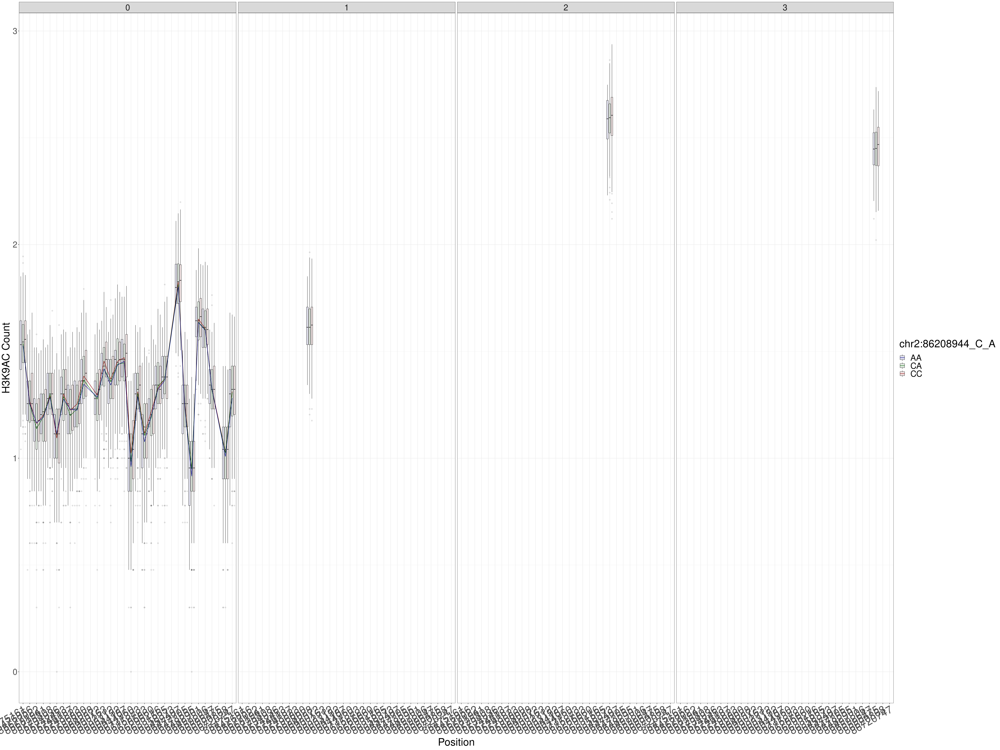

In [52]:
h_174_resid_plot_box%>%filter( )%>%mutate(peak_pos = as.numeric(peak), count = log10(count),group = case_when(peak_pos%>%within(85828028,85828028)~1,peak_pos%>%within(86358373,86358373)~2,peak_pos%>%within(86595475,86595475)~3 , .default = 0) )%>%filter( )%>%mutate( `chr2:86208944_C_A` = case_when(X ==0~ "CC", X ==1 ~ "CA", X == 2 ~ "AA" ), peak_pos = as.numeric(peak))%>%
    ggplot(aes(x = peak_pos, color = `chr2:86208944_C_A`, y = count ))+
     geom_boxplot(aes(x = peak, fill = `chr2:86208944_C_A`, y = count ),position=position_dodge(1), size = 0.3,color = "black" , alpha = 0.1)+
    stat_summary(fun=mean, geom="line", aes(group = X ,color = `chr2:86208944_C_A`,x = peak),size = 0.5)+facet_grid(.~group,scale = "free_y") +
    theme_bw()+theme(text = element_text(size = 30),panel.background = element_rect(), axis.text.x =  element_text(angle = 30,  hjust=1,size = 30))+
    xlab("")+ylab("H3K9AC Count")+ xlab("Position")+scale_fill_discrete(type = c("darkblue","darkgreen","darkred"))+scale_color_discrete(type = c("darkblue","darkgreen","darkred"))+  scale_x_discrete(breaks = function(x){x[c(TRUE, T)]})

In [100]:
median_plot1 = h_174_resid_plot_box%>%filter( )%>%mutate(peak_pos = as.numeric(peak), count = log10(count),group = case_when(peak_pos%>%within(85828028,85828028)~1,peak_pos%>%within(86358373,86358373)~2,peak_pos%>%within(86595475,86595475)~3 , .default = 0) )%>%filter( )%>%mutate( `chr2:86208944_C_A` = case_when(X ==0~ "CC", X ==1 ~ "CA", X == 2 ~ "AA" ), peak_pos = as.numeric(peak))%>%
    ggplot(aes(x = peak_pos, color = `chr2:86208944_C_A`, y = count ))+
    geom_boxplot(aes(x = peak, fill = `chr2:86208944_C_A`, y = count ),position=position_dodge(1), size = 0.3,color = "black" , alpha = 0.1)+
    stat_summary(fun=mean, geom="line", aes(group = X ,color = `chr2:86208944_C_A`,x = peak),size = 0.5)+#facet_grid(.~group,scale = "free_y") +
    #geom_point(aes( x = peak%>%as.numeric, y = 0), color = "red", size = 4 )+
    theme_bw()+theme(text = element_text(size = 30),panel.background = element_rect(), axis.text.x =  element_text(angle = 30,  hjust=1,size = 30))+
    xlab("")+ylab("H3K9AC Count")+ xlab("Position")+scale_fill_discrete(type = c("darkblue","darkgreen","darkred"))+scale_color_discrete(type = c("darkblue","darkgreen","darkred"))+  scale_x_discrete(breaks = function(x){x[c(TRUE, T)]})

In [62]:
median_plot = h_174_resid_plot_box%>%filter( )%>%mutate(peak_pos = as.numeric(peak), count = log10(count),group = case_when(peak_pos%>%within(85828028,85828028)~1,peak_pos%>%within(86358373,86358373)~2,peak_pos%>%within(86595475,86595475)~3 , .default = 0) )%>%filter( )%>%mutate( `chr2:86208944_C_A` = case_when(X ==0~ "CC", X ==1 ~ "CA", X == 2 ~ "AA" ), peak_pos = as.numeric(peak))%>%
    ggplot(aes(x = peak_pos, color = `chr2:86208944_C_A`, y = count ))+
    #geom_boxplot(aes(x = peak, fill = `chr2:86208944_C_A`, y = count ),position=position_dodge(1), size = 0.3,color = "black" , alpha = 0.1)+
    stat_summary(fun=mean, geom="line", aes(group = X ,color = `chr2:86208944_C_A`,x = peak_pos),size = 0.5)+#facet_grid(.~group,scale = "free_y") +
    geom_point(aes( x = peak%>%as.numeric, y = 0), color = "red", size = 4 )+
    theme_bw()+theme(text = element_text(size = 30),panel.background = element_rect(), axis.text.x =  element_text(angle = 90,  hjust=1,size = 30))+
    ylab("H3K9AC log10 Count")+ xlab("Position")+scale_fill_discrete(type = c("darkblue","darkgreen","darkred"))+scale_color_discrete(type = c("darkblue","darkgreen","darkred"))+  scale_x_continuous(breaks = seq(plot_range[1],plot_range[2],length.out = 20), limits = plot_range)

In [58]:
plot_range = c(min(effect_df$pos),max(effect_df$pos))

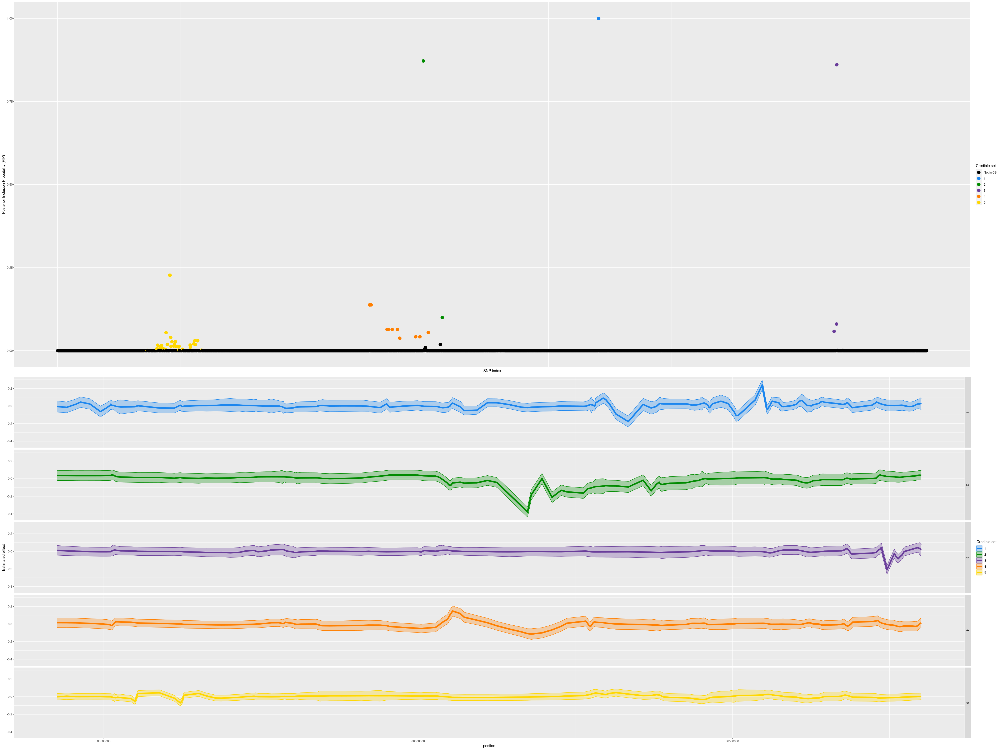

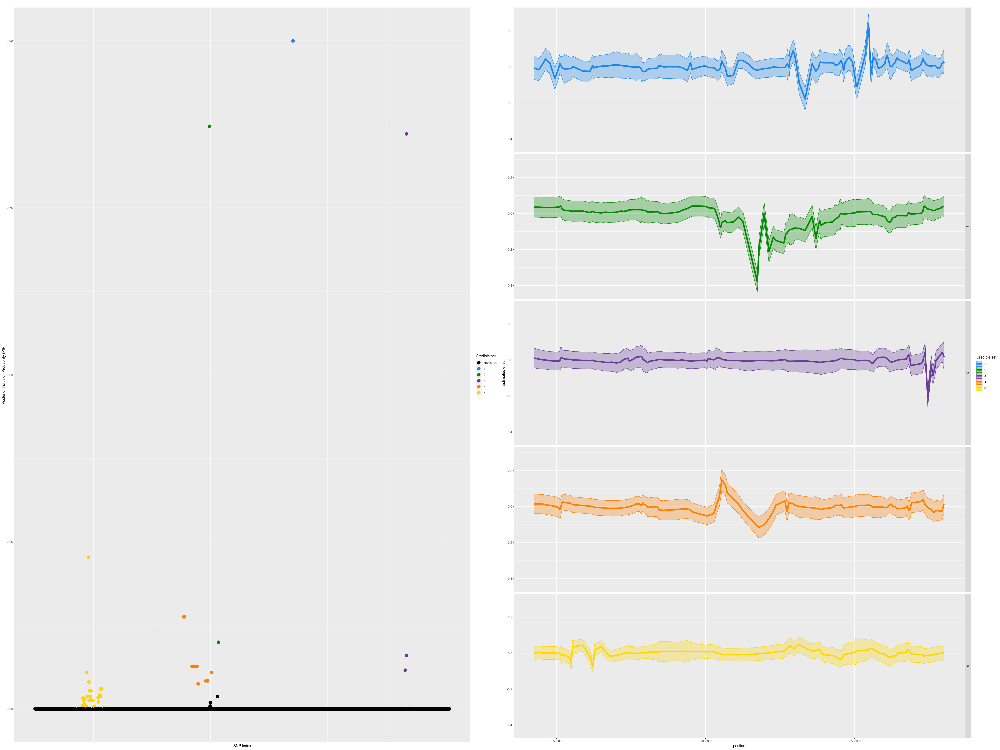

In [171]:
plot_susiF(tad174_1$tad174_1)

New names:
• `` -> `...1`
• `` -> `...2`
• `` -> `...3`
• `` -> `...4`
• `` -> `...5`


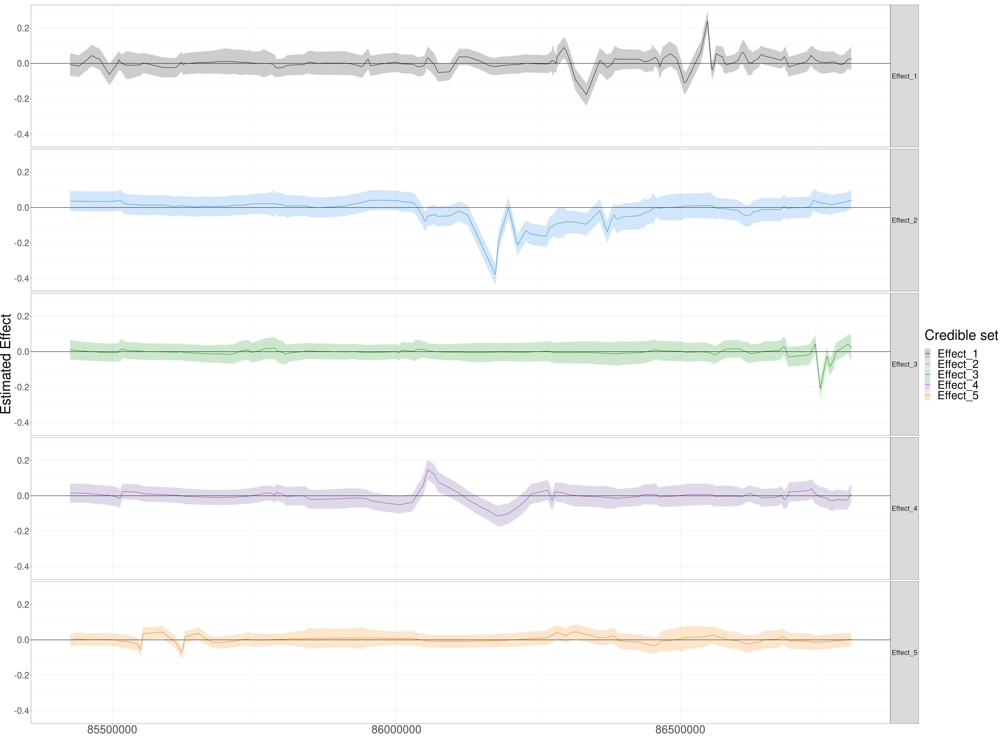

In [170]:
 effect_extract_df(tad174_1$tad174_1)%>%plot_effect()

In [55]:
tad174_1 =attach("~/GIT/neuro-mQTL/notebook/superfine_casestudy/refined_tad174_ha_haQTL (1).RData")

In [56]:
effect_df = effect_extract_df(tad174_1$tad174_1,1)

New names:
• `` -> `...1`


In [87]:
(86438737+86511107)/2

[1] 86474922

New names:
• `` -> `...1`
Warning message:
“Removed 270 rows containing missing values (`geom_line()`).”


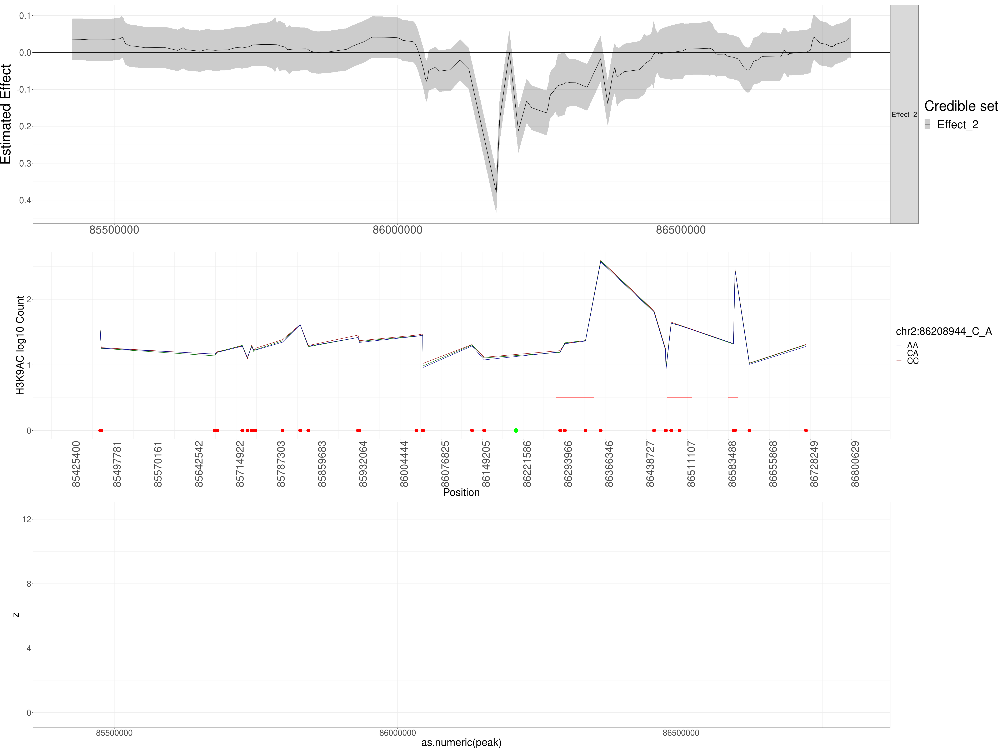

In [172]:
cowplot::plot_grid(plotlist = list(effect_extract_df(tad174_1$tad174_1,2)%>%plot_effect, median_plot+geom_point(x = 86208944, y = 0, color = "green", size = 5)+
                                           geom_segment(aes(x = 86280000, xend = 86346346, y = 0.5, yend = 0.5 ), color = "red" )+
                                           geom_segment(aes(x = (86438737+86511107)/2, xend = 86520000, y = 0.5, yend = 0.5 ), color = "red" )+
                                           geom_segment(aes(x = 86583488,xend = 86600000, y = 0.5, yend = 0.5 ), color = "red" )

                                   ,
                                  b%>%ggplot()+xlim(plot_range)+theme_bw()+geom_line(aes(x = as.numeric(peak), y = z ), color= "red")+theme(text=element_text(size  = 30))
                                  
                                  
                                  ),ncol = 1, align = "v",axis = "tlbr",rel_heights = c(6,6)) 

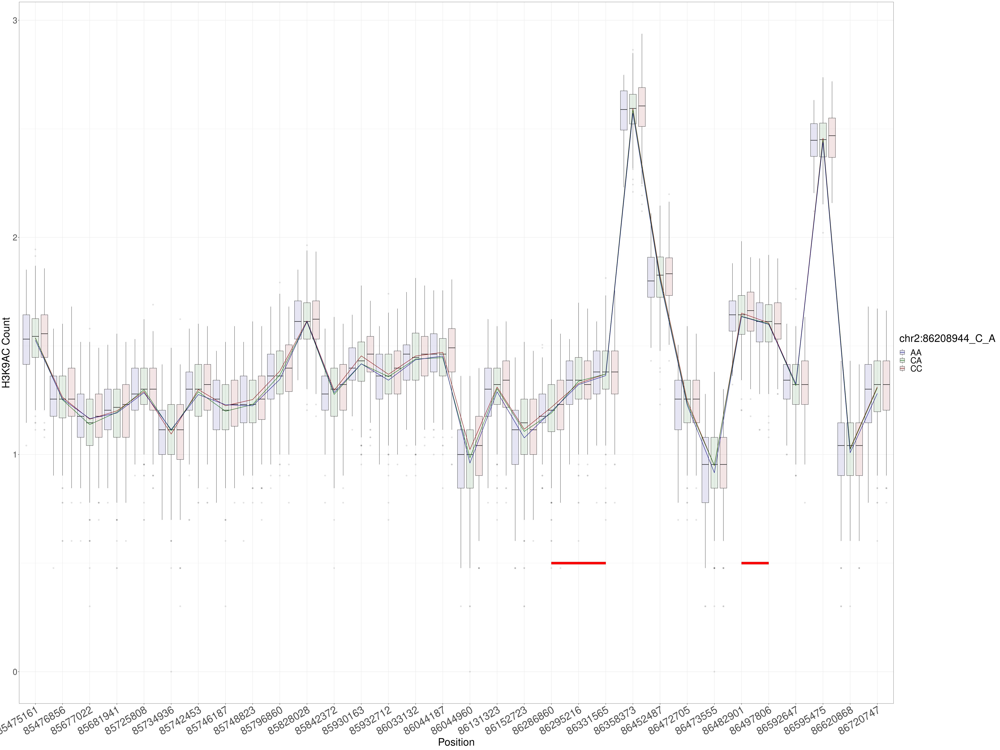

In [105]:
median_plot1+
 geom_segment(aes(x = "86286860", xend = "86331565", y = 0.5, yend = 0.5 ), color = "red", size = 3 )+
 geom_segment(aes(x = "86482901", xend = "86497806", y = 0.5, yend = 0.5 ), color = "red", size = 3 )

New names:
• `` -> `...1`


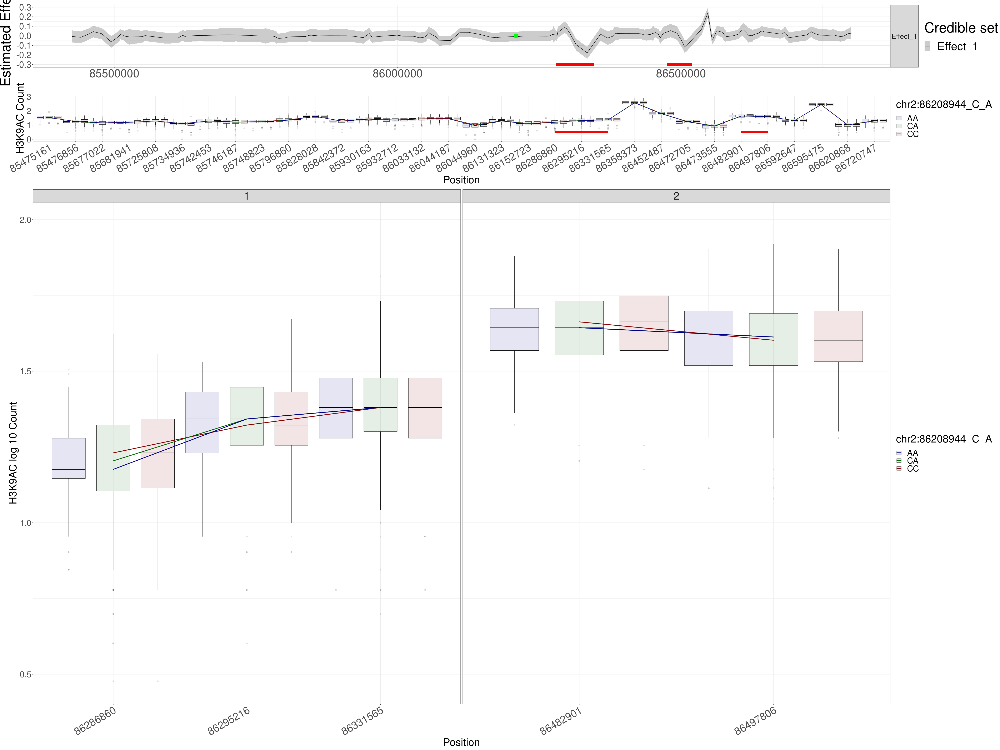

In [118]:
cowplot::plot_grid(plotlist = list(effect_extract_df(tad174_1$tad174_1,1)%>%plot_effect+geom_point(x = 86208944, y = 0, color = "green", size = 5)+
                                           geom_segment(aes(x = 86280000, xend = 86346346, y = -0.3, yend = -0.3 ), color = "red" , size = 3)+
                                           geom_segment(aes(x = (86438737+86511107)/2, xend = 86520000, y = -0.3, yend = -0.3 ), color = "red", size = 3 )#+
                                           #geom_segment(aes(x = 86583488,xend = 86600000, y = 0.5, yend = 0.5 ), color = "red" )

                                   ,median_plot1+
 geom_segment(aes(x = "86286860", xend = "86331565", y = 0.5, yend = 0.5 ), color = "red", size = 3 )+
 geom_segment(aes(x = "86482901", xend = "86497806", y = 0.5, yend = 0.5 ), color = "red", size = 3 ),
                                  
                                  h_174_resid_plot_box%>%filter( )%>%mutate(peak_pos = as.numeric(peak), count = log10(count),group = case_when(peak_pos%>%within(86280000,86346346)~1,peak_pos%>%within(86474922,86520000)~2 , .default = 0) )%>%filter(group != 0  )%>%mutate( `chr2:86208944_C_A` = case_when(X ==0~ "CC", X ==1 ~ "CA", X == 2 ~ "AA" ), peak_pos = as.numeric(peak))%>%
    ggplot(aes(x = peak_pos, color = `chr2:86208944_C_A`, y = count ))+
    geom_boxplot(aes(x = peak, fill = `chr2:86208944_C_A`, y = count ),position=position_dodge(1), size = 0.3,color = "black" , alpha = 0.1)+
    stat_summary(fun=median, geom="line", aes(group = X ,color = `chr2:86208944_C_A`,x = peak),size = 1)+facet_grid(.~group,scale = "free") +
    #geom_point(aes( x = peak%>%as.numeric, y = 0), color = "red", size = 4 )+
    theme_bw()+theme(text = element_text(size = 30),panel.background = element_rect(), axis.text.x =  element_text(angle = 30,  hjust=1,size = 30),strip.text =  element_text(size = 30))+
    xlab("")+ylab("H3K9AC log 10 Count")+ xlab("Position")+scale_fill_discrete(type = c("darkblue","darkgreen","darkred"))+scale_color_discrete(type = c("darkblue","darkgreen","darkred"))+  scale_x_discrete(breaks = function(x){x[c(TRUE, T)]})
                                  ),ncol = 1, align = "v",axis = "tlbr",rel_heights = c(1,1,6)) 

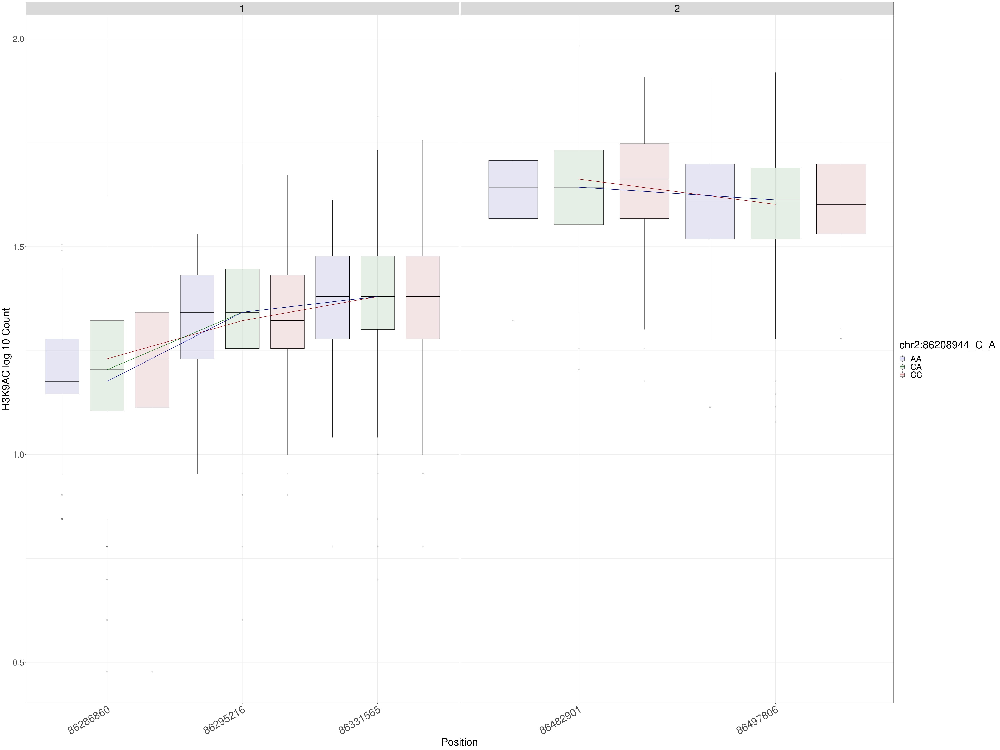

In [112]:
h_174_resid_plot_box%>%filter( )%>%mutate(peak_pos = as.numeric(peak), count = log10(count),group = case_when(peak_pos%>%within(86280000,86346346)~1,peak_pos%>%within(86474922,86520000)~2 , .default = 0) )%>%filter(group != 0  )%>%mutate( `chr2:86208944_C_A` = case_when(X ==0~ "CC", X ==1 ~ "CA", X == 2 ~ "AA" ), peak_pos = as.numeric(peak))%>%
    ggplot(aes(x = peak_pos, color = `chr2:86208944_C_A`, y = count ))+
    geom_boxplot(aes(x = peak, fill = `chr2:86208944_C_A`, y = count ),position=position_dodge(1), size = 0.3,color = "black" , alpha = 0.1)+
    stat_summary(fun=median, geom="line", aes(group = X ,color = `chr2:86208944_C_A`,x = peak),size = 0.5)+facet_grid(.~group,scale = "free") +
    #geom_point(aes( x = peak%>%as.numeric, y = 0), color = "red", size = 4 )+
    theme_bw()+theme(text = element_text(size = 30),panel.background = element_rect(), axis.text.x =  element_text(angle = 30,  hjust=1,size = 30),strip.text =  element_text(size = 30))+
    xlab("")+ylab("H3K9AC log 10 Count")+ xlab("Position")+scale_fill_discrete(type = c("darkblue","darkgreen","darkred"))+scale_color_discrete(type = c("darkblue","darkgreen","darkred"))+  scale_x_discrete(breaks = function(x){x[c(TRUE, T)]})

## TAD 1217

In [ ]:
eq

In [123]:
h16 = read_delim("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/haQTL_pure_completed_unlimited_16.tsv")


Rows: 25937 Columns: 14
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (4): variants, ref, alt, molecular_trait_id
dbl (10): snps_index, chromosome, position, cs_order, pip, finemapped_region...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [124]:
h16%>%filter(molecular_trait_id == "tad1217",cs_order == 1)%>%arrange(-pip)

variants,snps_index,chromosome,position,ref,alt,cs_order,pip,molecular_trait_id,finemapped_region_start,finemapped_region_end,purity,is_dummy,effect_peak_pos
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr15:92734199_C_G,9951,15,92734199,C,G,1,1,tad1217,89600000,9.3e+07,1,0,92591699


In [141]:
tad1217_h = raw_data_proc("tad1217","/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/phenotype_list", "/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/covar_list"  ,"chr15",89600000,9.3e+07)

Rows: 1 Columns: 2
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): tissue, path

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 1 Columns: 2
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): tissue, path

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 76 Columns: 593
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr   (1): #id
dbl (592): SM-CJEFU, MAP46251007, SM-CJFNY, SM-CJGNQ, SM-CTDQZ, SM-CJIWY, SM...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] "Dimension of X matrix: 1160 10793"
[1] "Dimension of Y matrix: 270 592"


In [126]:
h16%>%filter(molecular_trait_id == "tad1217",cs_order == 1)%>%pull("variants")

[1] "chr15:92734199_C_G"

In [127]:
h16%>%filter(molecular_trait_id == "tad1217",cs_order == 5)%>%pull("variants")

[1] "chr15:92624920_G_A"

In [129]:
table(tad1217_h$X[,h16%>%filter(molecular_trait_id == "tad1217",cs_order == 5)%>%pull("variants")])


  0   1   2 
326 229  37 

In [142]:
table(tad1217_h$X[,h16%>%filter(molecular_trait_id == "tad1217",cs_order == 1)%>%pull("variants")])


  0   1   2 
 32 208 352 

In [144]:
h_1217_resid = tad1217_h$Y%>%as_tibble%>%`colnames<-`(tad1217_h$pos)%>%mutate(X =  tad1217_h$X[,h16%>%filter(molecular_trait_id == "tad1217",cs_order == 1)%>%pull("variants")] )

In [131]:
raw_data_box_plot_prep

function(df,region_df,tad,CS){
df = df[,colnames(df) %in% c(region_df%>%filter(molecular_trait_id == tad, CS == CS )%>%pull(start), "X")]%>%
    mutate(X = as.factor(round(X)))%>%pivot_longer(cols = 1:(ncol(.)-1), names_to = "peak", values_to = "count" )%>%
    group_by(X,peak)
return(df)
}

In [146]:
haQTL_affected_region%>%filter(molecular_trait_id%in% "tad1217")

CS,Start,End,analysis,chr,molecular_trait_id,purity,start
<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<dbl>
1,89888255,90024229,rosmap_haqtl,chr15,tad1217,NA,89889090
1,89888255,90024229,rosmap_haqtl,chr15,tad1217,NA,89890789
1,89888255,90024229,rosmap_haqtl,chr15,tad1217,NA,89893979
1,89888255,90024229,rosmap_haqtl,chr15,tad1217,NA,89898418
1,89888255,90024229,rosmap_haqtl,chr15,tad1217,NA,89912701
1,89888255,90024229,rosmap_haqtl,chr15,tad1217,NA,89948922
1,89888255,90024229,rosmap_haqtl,chr15,tad1217,NA,89982773
1,89888255,90024229,rosmap_haqtl,chr15,tad1217,NA,90000678
1,89888255,90024229,rosmap_haqtl,chr15,tad1217,NA,90002477


In [40]:
raw_data_box_plot_prep

function(df,region_df,tad,CS){
df = df[,colnames(df) %in% c(region_df%>%filter(molecular_trait_id == tad, CS == CS )%>%pull(start), "X")]%>%
    mutate(X = as.factor(round(X)))%>%pivot_longer(cols = 1:(ncol(.)-1), names_to = "peak", values_to = "count" )%>%
    group_by(X,peak)
return(df)
}

In [151]:
h_1217_resid_plot_box = h_1217_resid%>% mutate(X = as.factor(round(X))) %>% 
        pivot_longer(cols = 1:(ncol(.) - 1), names_to = "peak", 
            values_to = "count") %>% group_by(X, peak)

In [147]:
h_1217_resid_plot = raw_data_plot_prep(h_1217_resid,haQTL_affected_region ,"tad1217")

`summarise()` has grouped output by 'X'. You can override using the `.groups`
argument.


In [152]:
h_1217_resid_plot_box%>%write_delim("~/GIT/neuro-mQTL/notebook/3_1217_1_rawdata_plot.tsv","\t")

In [153]:
h_1217_resid_plot_box = read_delim("~/GIT/neuro-mQTL/notebook/3_1217_1_rawdata_plot.tsv","\t")

Rows: 159840 Columns: 3
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
dbl (3): X, peak, count

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


ERROR: Error in parse(text = x, srcfile = src): <text>:1:14: unexpected input
1: chr2:88170344_
                 ^


In [155]:
table(h_1217_resid$X)


  0   1   2 
 32 208 352 

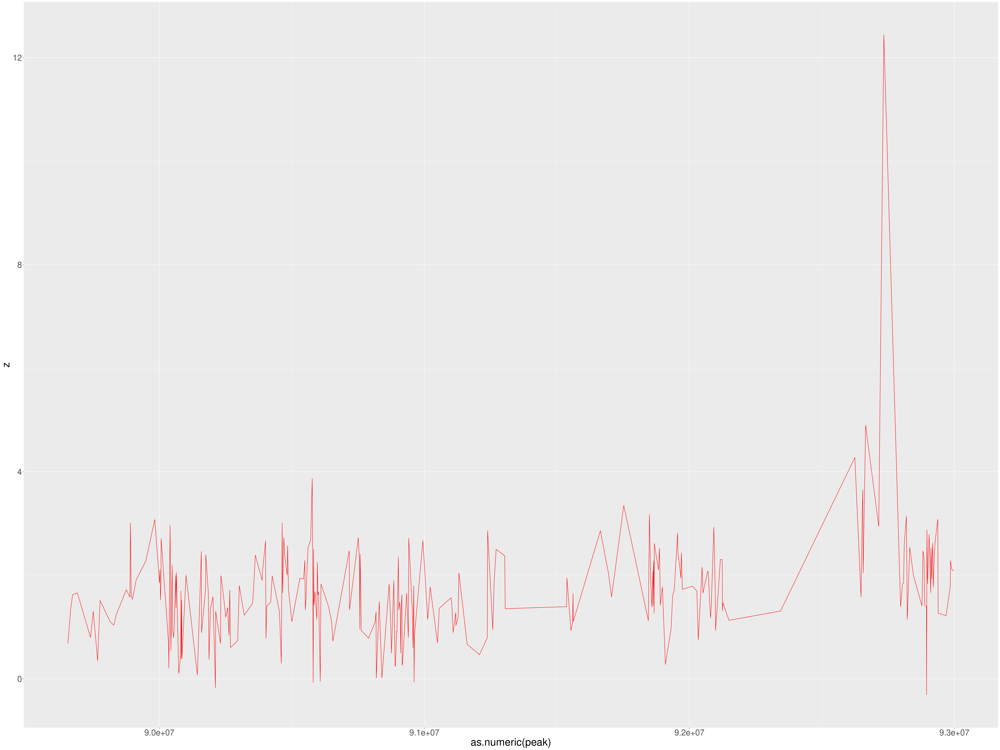

In [157]:
(h_1217_resid_plot_box%>%group_by(peak)%>%filter()%>%summarize(z = (lm(count~(X))%>%summary)$coef[2,3]))->b
b%>%ggplot()+geom_line(aes(x = as.numeric(peak), y = z ), color= "red")+theme(text=element_text(size  = 30))

Warning message:
“Removed 1 rows containing non-finite values (`stat_boxplot()`).”
Warning message:
“Removed 1 rows containing non-finite values (`stat_summary()`).”


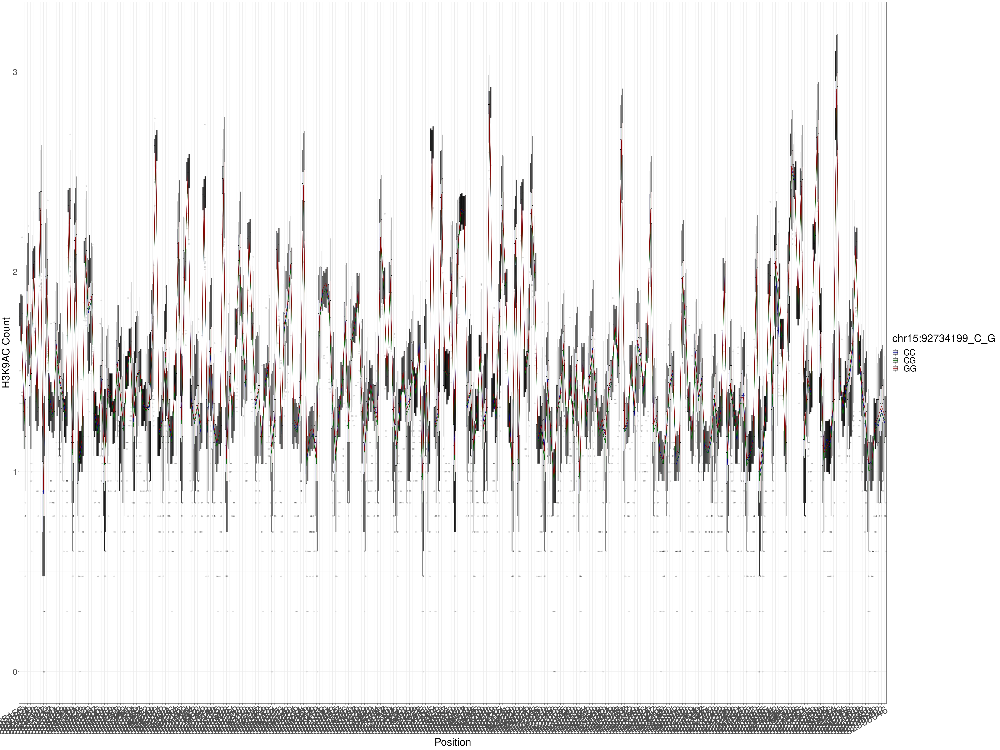

In [160]:
h_1217_resid_plot_box%>%filter( )%>%mutate(peak = as.character(peak),peak_pos = as.numeric(peak), count = log10(count),group = case_when(peak_pos%>%within(85828028,85828028)~1,peak_pos%>%within(86358373,86358373)~2,peak_pos%>%within(86595475,86595475)~3 , .default = 0) )%>%filter( )%>%mutate( `chr15:92734199_C_G` = case_when(X ==0~ "CC", X ==1 ~ "CG", X == 2 ~ "GG" ), peak_pos = as.numeric(peak))%>%
    ggplot(aes(x = peak_pos, color = `chr15:92734199_C_G`, y = count ))+
    geom_boxplot(aes(x = peak, fill = `chr15:92734199_C_G`, y = count ),position=position_dodge(1), size = 0.3,color = "black" , alpha = 0.1)+
    stat_summary(fun=mean, geom="line", aes(group = X ,color = `chr15:92734199_C_G`,x = peak),size = 0.5)+#facet_grid(.~group,scale = "free_y") +
    #geom_point(aes( x = peak%>%as.numeric, y = 0), color = "red", size = 4 )+
    theme_bw()+theme(text = element_text(size = 30),panel.background = element_rect(), axis.text.x =  element_text(angle = 30,  hjust=1,size = 30))+
    xlab("")+ylab("H3K9AC Count")+ xlab("Position")+scale_fill_discrete(type = c("darkblue","darkgreen","darkred"))+scale_color_discrete(type = c("darkblue","darkgreen","darkred"))+  scale_x_discrete(breaks = function(x){x[c(TRUE, T)]})

In [126]:
h16%>%filter(molecular_trait_id == "tad1217",cs_order == 1)%>%pull("variants")

[1] "chr15:92734199_C_G"

In [127]:
h16%>%filter(molecular_trait_id == "tad1217",cs_order == 5)%>%pull("variants")

[1] "chr15:92624920_G_A"

In [164]:
h16%>%filter(molecular_trait_id == "tad1217",cs_order == 2)%>%pull("variants")

[1] "chr15:91104210_T_G"

In [129]:
table(tad1217_h$X[,h16%>%filter(molecular_trait_id == "tad1217",cs_order == 5)%>%pull("variants")])


  0   1   2 
326 229  37 

In [165]:
table(tad1217_h$X[,h16%>%filter(molecular_trait_id == "tad1217",cs_order == 2)%>%pull("variants")])


  0   1   2 
112 282 198 

In [166]:
h_1217_resid = tad1217_h$Y%>%as_tibble%>%`colnames<-`(tad1217_h$pos)%>%mutate(X =  tad1217_h$X[,h16%>%filter(molecular_trait_id == "tad1217",cs_order == 2)%>%pull("variants")] )

In [131]:
raw_data_box_plot_prep

function(df,region_df,tad,CS){
df = df[,colnames(df) %in% c(region_df%>%filter(molecular_trait_id == tad, CS == CS )%>%pull(start), "X")]%>%
    mutate(X = as.factor(round(X)))%>%pivot_longer(cols = 1:(ncol(.)-1), names_to = "peak", values_to = "count" )%>%
    group_by(X,peak)
return(df)
}

In [40]:
raw_data_box_plot_prep

function(df,region_df,tad,CS){
df = df[,colnames(df) %in% c(region_df%>%filter(molecular_trait_id == tad, CS == CS )%>%pull(start), "X")]%>%
    mutate(X = as.factor(round(X)))%>%pivot_longer(cols = 1:(ncol(.)-1), names_to = "peak", values_to = "count" )%>%
    group_by(X,peak)
return(df)
}

In [167]:
h_1217_resid_plot_box = h_1217_resid%>% mutate(X = as.factor(round(X))) %>% 
        pivot_longer(cols = 1:(ncol(.) - 1), names_to = "peak", 
            values_to = "count") %>% group_by(X, peak)

In [147]:
h_1217_resid_plot = raw_data_plot_prep(h_1217_resid,haQTL_affected_region ,"tad1217")

`summarise()` has grouped output by 'X'. You can override using the `.groups`
argument.


In [168]:
h_1217_resid_plot_box%>%write_delim("~/GIT/neuro-mQTL/notebook/3_1217_2_rawdata_plot.tsv","\t")

In [169]:
h_1217_resid_plot_box = read_delim("~/GIT/neuro-mQTL/notebook/3_1217_2_rawdata_plot.tsv","\t")

Rows: 159840 Columns: 3
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
dbl (3): X, peak, count

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
